#### Insurance Claims- Fraud Detection

In [847]:
!pip install imbalanced-learn

###### Import Libraries

In [848]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import f_oneway
%matplotlib inline

from sklearn import metrics
from sklearn.metrics import make_scorer
from sklearn.preprocessing import LabelEncoder,StandardScaler

from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings('ignore')

###### Load Dataset

In [775]:
pd.pandas.set_option('display.max_columns',None)
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')


###### Dimension of Dataset

In [776]:
df.shape

(1000, 40)

*Observation :*<br>*In this dataset there are 1000 rows and 40 columns*

###### Sample of Dataset

In [777]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


###### Breif Infomation About Data

In [778]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

*Observation :*<br>*In this dataset there are 2 float type, 17 int type, and 21 object type columns*
<br>*Every columns have 1000 non null values it means no missing vales*

###### Statistical Summary of Data

###### ---for numerical variable

In [779]:
df.describe(exclude='object')

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


###### ---for Categorical variable

In [780]:
df.describe(include=[object]) 

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,4,4,5,7,7,1000,3,3,14,39,2
top,28-04-1992,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,4279 Solo Drive,?,NO,Suburu,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,292,354,292,262,157,1,360,343,80,43,753


*Observation :*<br>*capital gain and Capital loss have abnormalities.*

###### check for unique values in columns

In [781]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

*Observation :*<br>*policy_state,policy_csl,policy_deductable,umbrella_limit,insured_sex,insured_education_level,
insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,
authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,
witnesses,police_report_available,auto_make,fraud_reported,_c39 columns have less than 20 unique so they are 
categorical variable and rest are countinuous variables*

###### check for missing values in columns

In [782]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [783]:
print("Total missing values :",df.isnull().sum().sum())

Total missing values : 1000


###### total % missing values in columns

In [784]:
print("Total % of MIssing Values in Columns :")
df.isnull().sum()/df.shape[0]*100 

Total % of MIssing Values in Columns :


months_as_customer               0.0
age                              0.0
policy_number                    0.0
policy_bind_date                 0.0
policy_state                     0.0
policy_csl                       0.0
policy_deductable                0.0
policy_annual_premium            0.0
umbrella_limit                   0.0
insured_zip                      0.0
insured_sex                      0.0
insured_education_level          0.0
insured_occupation               0.0
insured_hobbies                  0.0
insured_relationship             0.0
capital-gains                    0.0
capital-loss                     0.0
incident_date                    0.0
incident_type                    0.0
collision_type                   0.0
incident_severity                0.0
authorities_contacted            0.0
incident_state                   0.0
incident_city                    0.0
incident_location                0.0
incident_hour_of_the_day         0.0
number_of_vehicles_involved      0.0
p

*Observation :*<br>*Only column _c39 have 100% Missing values*

###### check for duplicate rows

In [785]:
sum(df.duplicated())

0

*Observation :*<br>*No duplicate rows*

###### check for zeros in columns

In [786]:
print(df[df==0].count())

months_as_customer               1
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                 798
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                  508
capital-loss                   475
incident_date                    0
incident_type                    0
collision_type                   0
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day        52
number_of_vehicles_involved      0
property_damage                  0
bodily_injuries     

In [787]:
print('Total zeros in Dataset:', df[df==0].count().sum())

Total zeros in Dataset: 2467


###### total % of zeros in columns

In [788]:
print("Total % of Zeros as Value in Columns")
df[df==0].count()/df.shape[0]*100   

Total % of Zeros as Value in Columns


months_as_customer              0.1
age                             0.0
policy_number                   0.0
policy_bind_date                0.0
policy_state                    0.0
policy_csl                      0.0
policy_deductable               0.0
policy_annual_premium           0.0
umbrella_limit                 79.8
insured_zip                     0.0
insured_sex                     0.0
insured_education_level         0.0
insured_occupation              0.0
insured_hobbies                 0.0
insured_relationship            0.0
capital-gains                  50.8
capital-loss                   47.5
incident_date                   0.0
incident_type                   0.0
collision_type                  0.0
incident_severity               0.0
authorities_contacted           0.0
incident_state                  0.0
incident_city                   0.0
incident_location               0.0
incident_hour_of_the_day        5.2
number_of_vehicles_involved     0.0
property_damage             

###### Identification of variables

*Observation :*<br>*months_as_customer,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,
bodily_injuries,witnesses,injury_claim,property_claim columns have zeros as values*

###### check for numerical variables

In [789]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']
print('Number of numerical variables: ', len(numerical_features))

Number of numerical variables:  19


In [790]:
for feature in numerical_features:
    print('The feature is {} and number of numerical are {}'.format(feature,len(df[feature].unique())))

The feature is months_as_customer and number of numerical are 391
The feature is age and number of numerical are 46
The feature is policy_number and number of numerical are 1000
The feature is policy_deductable and number of numerical are 3
The feature is policy_annual_premium and number of numerical are 991
The feature is umbrella_limit and number of numerical are 11
The feature is insured_zip and number of numerical are 995
The feature is capital-gains and number of numerical are 338
The feature is capital-loss and number of numerical are 354
The feature is incident_hour_of_the_day and number of numerical are 24
The feature is number_of_vehicles_involved and number of numerical are 4
The feature is bodily_injuries and number of numerical are 3
The feature is witnesses and number of numerical are 4
The feature is total_claim_amount and number of numerical are 763
The feature is injury_claim and number of numerical are 638
The feature is property_claim and number of numerical are 626
T

In [791]:
df[numerical_features].head()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,1,1,2,71610,6510,13020,52080,2004,NaN
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,1,0,0,5070,780,780,3510,2007,NaN
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,3,2,3,34650,7700,3850,23100,2007,NaN
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,1,1,2,63400,6340,6340,50720,2014,NaN
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,1,0,1,6500,1300,650,4550,2009,NaN


###### ---check for descrete variable

In [792]:
descrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<25]
print("Descrete Variables Count: {}".format(len(descrete_feature)),"\n")

for feature in descrete_feature:
    print('The feature is {} and number of numerical are {}'.format(feature,len(df[feature].unique())))
    
    
for feature in descrete_feature:
    print("\n",feature," : ", df[feature].unique())

Descrete Variables Count: 8 

The feature is policy_deductable and number of numerical are 3
The feature is umbrella_limit and number of numerical are 11
The feature is incident_hour_of_the_day and number of numerical are 24
The feature is number_of_vehicles_involved and number of numerical are 4
The feature is bodily_injuries and number of numerical are 3
The feature is witnesses and number of numerical are 4
The feature is auto_year and number of numerical are 21
The feature is _c39 and number of numerical are 1

 policy_deductable  :  [1000 2000  500]

 umbrella_limit  :  [       0  5000000  6000000  4000000  3000000  8000000  7000000  9000000
 10000000 -1000000  2000000]

 incident_hour_of_the_day  :  [ 5  8  7 20 19  0 23 21 14 22  9 12 15  6 16  4 10  1 17  3 11 13 18  2]

 number_of_vehicles_involved  :  [1 3 4 2]

 bodily_injuries  :  [1 0 2]

 witnesses  :  [2 0 3 1]

 auto_year  :  [2004 2007 2014 2009 2003 2012 2015 1996 2002 2006 2000 2010 1999 2011
 2005 2008 1995 2001 199

In [793]:
df[descrete_feature].head()

,policy_deductable,umbrella_limit,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,auto_year,_c39
0,1000,0,5,1,1,2,2004,NaN
1,2000,5000000,8,1,0,0,2007,NaN
2,2000,5000000,7,3,2,3,2007,NaN
3,2000,6000000,5,1,1,2,2014,NaN
4,1000,6000000,20,1,0,1,2009,NaN


###### ---check for countinuous variable

In [794]:
continuous_feature=[feature for feature in numerical_features if feature not in descrete_feature ]
print("Continuous Variables Count {}".format(len(continuous_feature)),"\n")

for feature in continuous_feature:
    print('The feature is:  {}     and number of numerical are:  {}'.format(feature,len(df[feature].unique())))

Continuous Variables Count 11 

The feature is:  months_as_customer     and number of numerical are:  391
The feature is:  age     and number of numerical are:  46
The feature is:  policy_number     and number of numerical are:  1000
The feature is:  policy_annual_premium     and number of numerical are:  991
The feature is:  insured_zip     and number of numerical are:  995
The feature is:  capital-gains     and number of numerical are:  338
The feature is:  capital-loss     and number of numerical are:  354
The feature is:  total_claim_amount     and number of numerical are:  763
The feature is:  injury_claim     and number of numerical are:  638
The feature is:  property_claim     and number of numerical are:  626
The feature is:  vehicle_claim     and number of numerical are:  726


In [795]:
df[continuous_feature].head()

,months_as_customer,age,policy_number,policy_annual_premium,insured_zip,capital-gains,capital-loss,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,328,48,521585,1406.91,466132,53300,0,71610,6510,13020,52080
1,228,42,342868,1197.22,468176,0,0,5070,780,780,3510
2,134,29,687698,1413.14,430632,35100,0,34650,7700,3850,23100
3,256,41,227811,1415.74,608117,48900,-62400,63400,6340,6340,50720
4,228,44,367455,1583.91,610706,66000,-46000,6500,1300,650,4550


###### check for categorical variable

In [796]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
print('Number of Categorical variables: ', len(categorical_features))

Number of Categorical variables:  21


In [797]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is policy_bind_date and number of categories are 951
The feature is policy_state and number of categories are 3
The feature is policy_csl and number of categories are 3
The feature is insured_sex and number of categories are 2
The feature is insured_education_level and number of categories are 7
The feature is insured_occupation and number of categories are 14
The feature is insured_hobbies and number of categories are 20
The feature is insured_relationship and number of categories are 6
The feature is incident_date and number of categories are 60
The feature is incident_type and number of categories are 4
The feature is collision_type and number of categories are 4
The feature is incident_severity and number of categories are 4
The feature is authorities_contacted and number of categories are 5
The feature is incident_state and number of categories are 7
The feature is incident_city and number of categories are 7
The feature is incident_location and number of categories ar

In [798]:
df[categorical_features].head()

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,17-10-2014,OH,250/500,MALE,MD,craft-repair,sleeping,husband,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,YES,YES,Saab,92x,Y
1,27-06-2006,IN,250/500,MALE,MD,machine-op-inspct,reading,other-relative,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,?,?,Mercedes,E400,Y
2,06-09-2000,OH,100/300,FEMALE,PhD,sales,board-games,own-child,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,NO,NO,Dodge,RAM,N
3,25-05-1990,IL,250/500,FEMALE,PhD,armed-forces,board-games,unmarried,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,?,NO,Chevrolet,Tahoe,Y
4,06-06-2014,IL,500/1000,MALE,Associate,sales,board-games,unmarried,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,NO,NO,Accura,RSX,N


###### ---check for binary variable

In [799]:
binary_feature=[feature for feature in categorical_features if len(df[feature].unique())==2 or len(df[feature].unique())<2 and feature not in date_feature]
print("Binary Variables Count: {}".format(len(binary_feature)))

Binary Variables Count: 2


In [800]:
for feature in binary_feature:
    print(feature," : ", df[feature].unique())

insured_sex  :  ['MALE' 'FEMALE']
fraud_reported  :  ['Y' 'N']


In [801]:
df[binary_feature].head()

,insured_sex,fraud_reported
0,MALE,Y
1,MALE,Y
2,FEMALE,N
3,FEMALE,Y
4,MALE,N


###### ---check for nominal variable

In [802]:
nominal_feature=[feature for feature in categorical_features if feature not in binary_feature]
print("Nominal feature Count {}".format(len(nominal_feature)))

Nominal feature Count 19


In [803]:
for feature in nominal_feature:
    print('The feature is {} and number of numerical are {}'.format(feature,len(df[feature].unique())))

The feature is policy_bind_date and number of numerical are 951
The feature is policy_state and number of numerical are 3
The feature is policy_csl and number of numerical are 3
The feature is insured_education_level and number of numerical are 7
The feature is insured_occupation and number of numerical are 14
The feature is insured_hobbies and number of numerical are 20
The feature is insured_relationship and number of numerical are 6
The feature is incident_date and number of numerical are 60
The feature is incident_type and number of numerical are 4
The feature is collision_type and number of numerical are 4
The feature is incident_severity and number of numerical are 4
The feature is authorities_contacted and number of numerical are 5
The feature is incident_state and number of numerical are 7
The feature is incident_city and number of numerical are 7
The feature is incident_location and number of numerical are 1000
The feature is property_damage and number of numerical are 3
The f

In [804]:
#nominalfeature=['Gender','Married','Dependents','Self_Employed','Property_Area']
for feature in nominal_feature :
    print(feature," : ", df[feature].unique())

policy_bind_date  :  ['17-10-2014' '27-06-2006' '06-09-2000' '25-05-1990' '06-06-2014'
 '12-10-2006' '04-06-2000' '03-02-1990' '05-02-1997' '25-07-2011'
 '26-05-2002' '29-05-1999' '20-11-1997' '26-10-2012' '28-12-1998'
 '19-10-1992' '08-06-2005' '15-11-2004' '28-12-2014' '02-08-1992'
 '25-06-2002' '27-11-2005' '27-05-1994' '08-02-1991' '02-02-1996'
 '05-12-2013' '20-09-1990' '18-07-2002' '08-02-1990' '04-03-2014'
 '18-02-2000' '19-06-2008' '01-08-2003' '04-04-1992' '13-01-1991'
 '08-08-2010' '09-03-2003' '03-02-1993' '25-11-2002' '27-07-1997'
 '08-05-1995' '30-08-2012' '30-04-2006' '13-04-2003' '05-12-2007'
 '21-08-2006' '08-01-1990' '18-03-1990' '07-01-2008' '10-03-1997'
 '10-01-2004' '20-08-1994' '02-06-2002' '28-04-1994' '17-08-2014'
 '11-08-2007' '20-11-2008' '18-10-1995' '19-05-1993' '26-02-2005'
 '14-02-1990' '30-09-1993' '10-06-2014' '28-10-2008' '24-04-2007'
 '13-12-1993' '17-08-2011' '20-08-1990' '11-02-1994' '22-02-1994'
 '15-08-2011' '11-11-1998' '04-12-1995' '28-12-2002' '1

In [805]:
df[nominal_feature].head()

,policy_bind_date,policy_state,policy_csl,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model
0,17-10-2014,OH,250/500,MD,craft-repair,sleeping,husband,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,YES,YES,Saab,92x
1,27-06-2006,IN,250/500,MD,machine-op-inspct,reading,other-relative,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,?,?,Mercedes,E400
2,06-09-2000,OH,100/300,PhD,sales,board-games,own-child,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,NO,NO,Dodge,RAM
3,25-05-1990,IL,250/500,PhD,armed-forces,board-games,unmarried,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,?,NO,Chevrolet,Tahoe
4,06-06-2014,IL,500/1000,Associate,sales,board-games,unmarried,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,NO,NO,Accura,RSX


###### check for cardinality

###### ---for categorical variables

Text(0.5, 1.0, 'Cardinality')

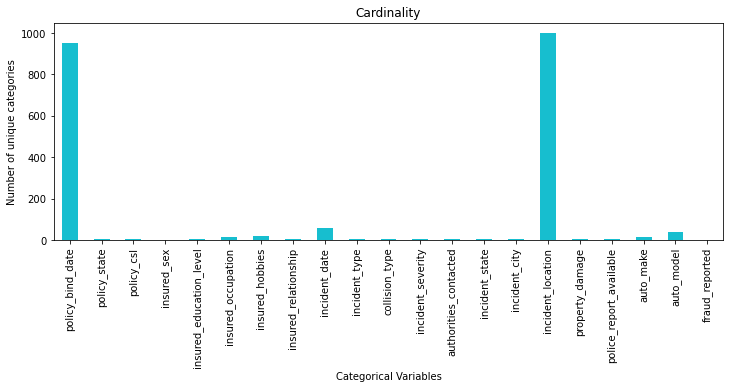

In [806]:
df[categorical_features].nunique().plot.bar(figsize=(12,4),color='#17becf')
plt.ylabel('Number of unique categories')
plt.xlabel('Categorical Variables')
plt.title('Cardinality')

*Observation :*<br>*policy_bind_date,incident_location have high cardinality*

###### check for outliers

###### ---for numerical variables

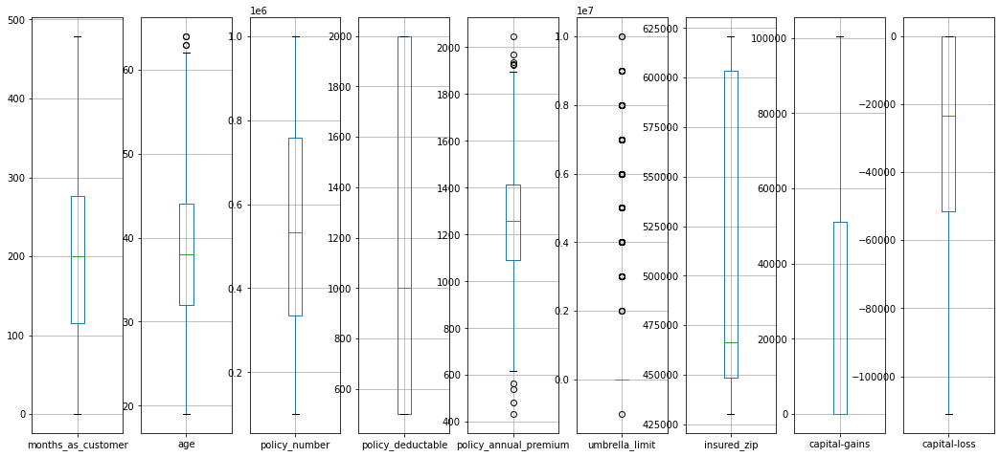

In [807]:
col1=['months_as_customer','age','policy_number','policy_deductable','policy_annual_premium','umbrella_limit','insured_zip','capital-gains','capital-loss']
fig, pltcan=plt.subplots(nrows=1, ncols=len(col1), figsize=(18,8))
for predcol , i in zip(col1, range(len(col1))):
    df.boxplot(column=predcol, figsize=(2,10), vert=True, ax=pltcan[i])

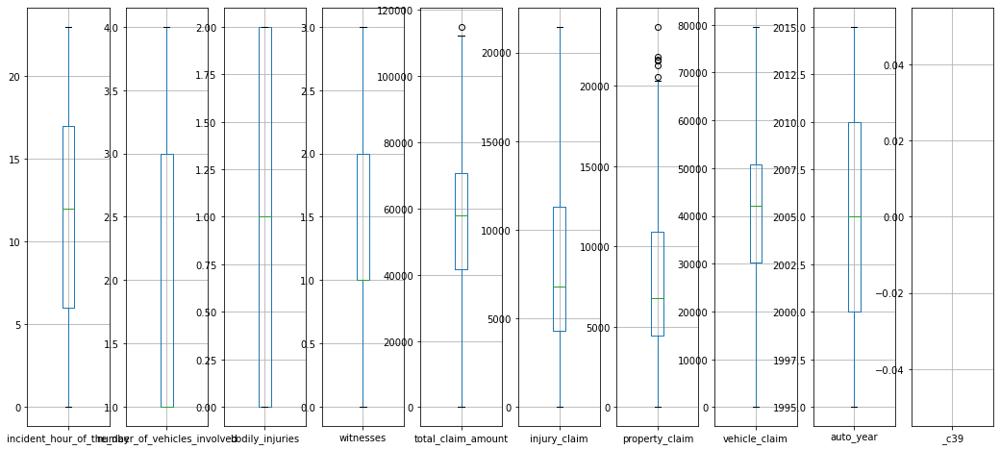

In [808]:
col1=['incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries','witnesses','total_claim_amount','injury_claim','property_claim','vehicle_claim','auto_year','_c39']
fig, pltcan=plt.subplots(nrows=1, ncols=len(col1), figsize=(18,8))
for predcol , i in zip(col1, range(len(col1))):
    df.boxplot(column=predcol, figsize=(2,10), vert=True, ax=pltcan[i])

*Observation :*<br>*age,policy_annual_premium,umberalla_limit,total_claim_amount,property_clam column have outliers*

###### check for skewness

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
_c39                                NaN
dtype: float64


<AxesSubplot:>

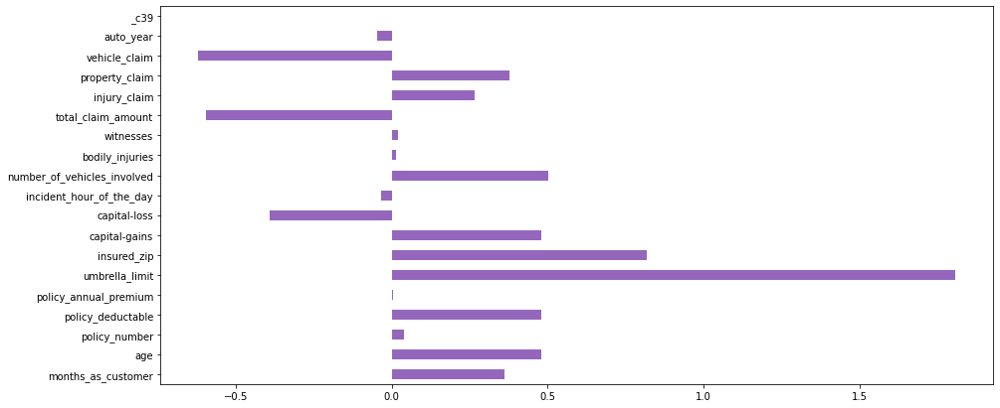

In [809]:
print(df.skew())
df.skew().plot(kind='barh',color='#9467bd',figsize=(15,7))

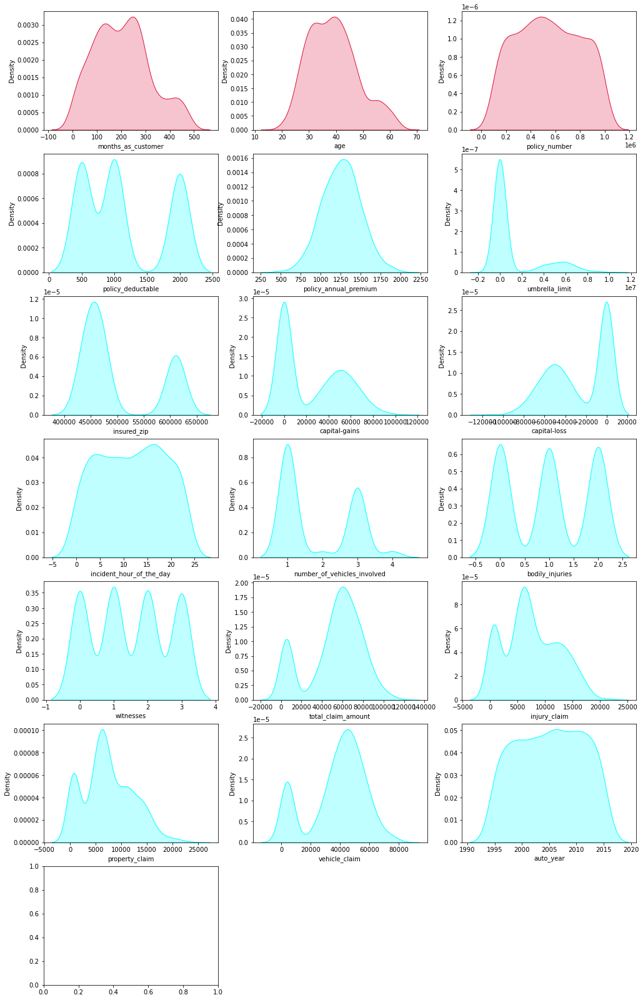

In [810]:
#Visualization of Skewness (numerical variable)
plt.figure(figsize=(17,79))
plt.subplot(19,3,1)
sns.kdeplot(df['months_as_customer'],color='crimson',shade=True)
plt.subplot(19,3,2)
sns.kdeplot(df['age'],color='crimson',shade=True)
plt.subplot(19,3,3)
sns.kdeplot(df['policy_number'],color='crimson',shade=True)
plt.subplot(19,3,4)
sns.kdeplot(df['policy_deductable'],color='aqua',shade=True)
plt.subplot(19,3,5)
sns.kdeplot(df['policy_annual_premium'],color='aqua',shade=True)
plt.subplot(19,3,6)
sns.kdeplot(df['umbrella_limit'],color='aqua',shade=True)
plt.subplot(19,3,7)
sns.kdeplot(df['insured_zip'],color='aqua',shade=True)
plt.subplot(19,3,8)
sns.kdeplot(df['capital-gains'],color='aqua',shade=True)
plt.subplot(19,3,9)
sns.kdeplot(df['capital-loss'],color='aqua',shade=True)
plt.subplot(19,3,10)
sns.kdeplot(df['incident_hour_of_the_day'],color='aqua',shade=True)
plt.subplot(19,3,11)
sns.kdeplot(df['number_of_vehicles_involved'],color='aqua',shade=True)
plt.subplot(19,3,12)
sns.kdeplot(df['bodily_injuries'],color='aqua',shade=True)
plt.subplot(19,3,13)
sns.kdeplot(df['witnesses'],color='aqua',shade=True)
plt.subplot(19,3,14)
sns.kdeplot(df['total_claim_amount'],color='aqua',shade=True)
plt.subplot(19,3,15)
sns.kdeplot(df['injury_claim'],color='aqua',shade=True)
plt.subplot(19,3,16)
sns.kdeplot(df['property_claim'],color='aqua',shade=True)
plt.subplot(19,3,17)
sns.kdeplot(df['vehicle_claim'],color='aqua',shade=True)
plt.subplot(19,3,18)
sns.kdeplot(df['auto_year'],color='aqua',shade=True)
plt.subplot(19,3,19)
sns.kdeplot(df['_c39'],color='aqua',shade=True)
plt.show()


*Observation :*<br>*there are skewness in columns*

###### Identify Target and Feature Variable

*Prediction-*<br>*Insurance Claim fraud Detection*

*Targe Variable (Depaendent Features)* <br>            *-fraud_reported* <br>
*Predictors (Independent Features)*<br>                 *- All variables* 

###### Univariate Analysis

###### 1. months_as_customer variable

<AxesSubplot:>

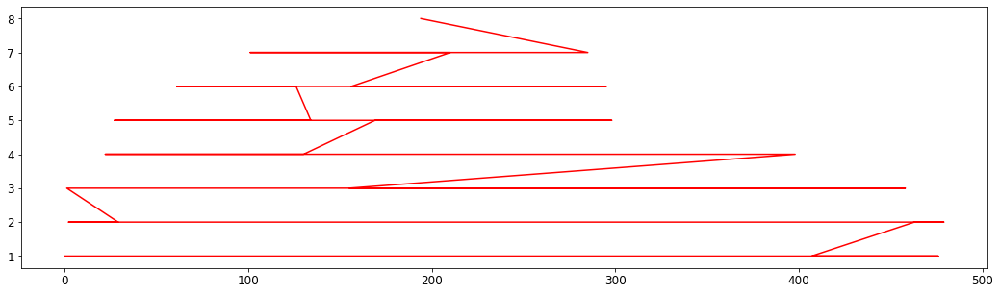

In [645]:
df['months_as_customer'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='red')

###### 2. age variable

<AxesSubplot:>

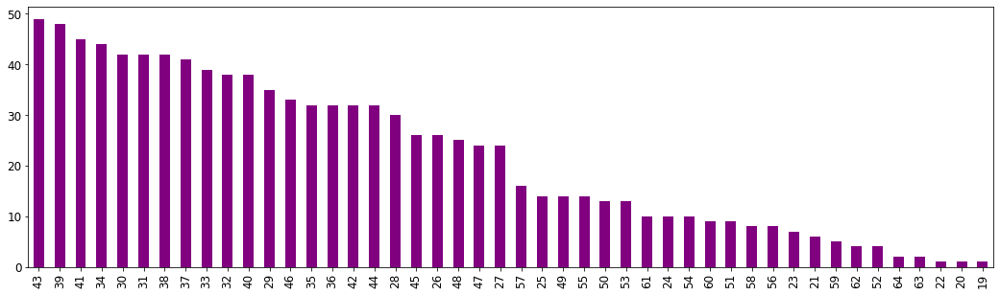

In [646]:
df['age'].value_counts().plot(kind = "bar",fontsize=12,figsize=(18,5),color='purple')

###### 3. policy_number variable

<AxesSubplot:>

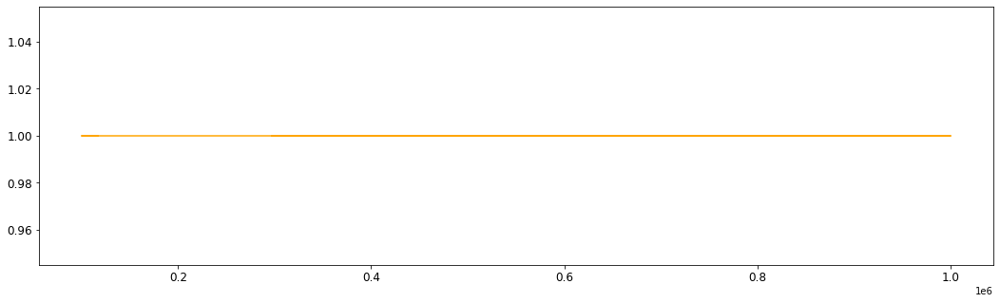

In [647]:
df['policy_number'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='orange')

###### 4. policy_bind_date variable

<AxesSubplot:>

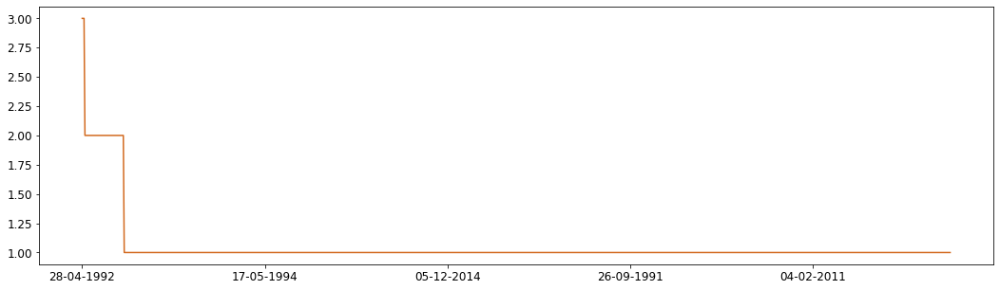

In [648]:
df['policy_bind_date'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='chocolate')

###### 5. policy_state variable

<AxesSubplot:ylabel='policy_state'>

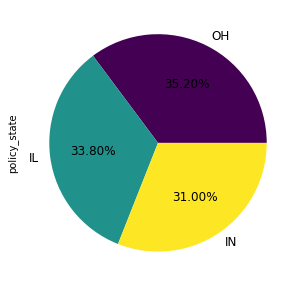

In [649]:
df['policy_state'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='viridis')

###### 6. policy_csl variable

<AxesSubplot:ylabel='policy_csl'>

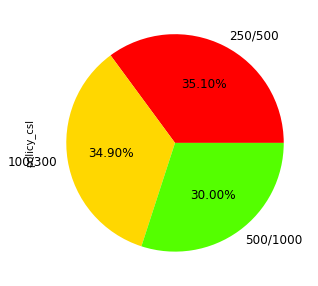

In [650]:
df['policy_csl'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='prism')

###### 7. policy_deductable variable

<AxesSubplot:ylabel='policy_deductable'>

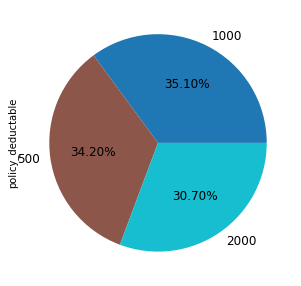

In [651]:
df['policy_deductable'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='tab10')

###### 8. policy_annual_premium variable

<AxesSubplot:>

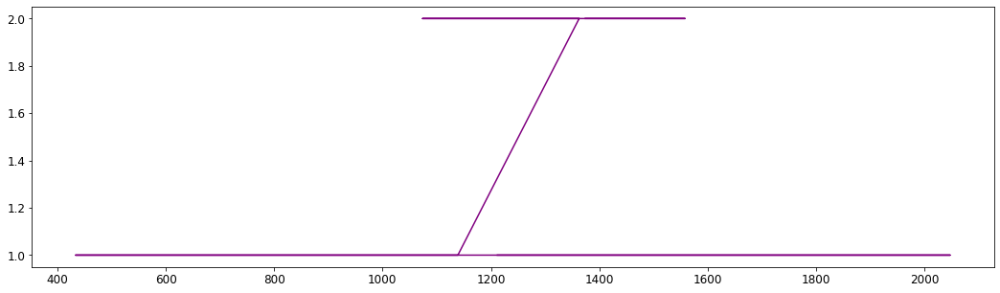

In [652]:
df['policy_annual_premium'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='purple')

###### 9. umbrella_limit variable

<AxesSubplot:>

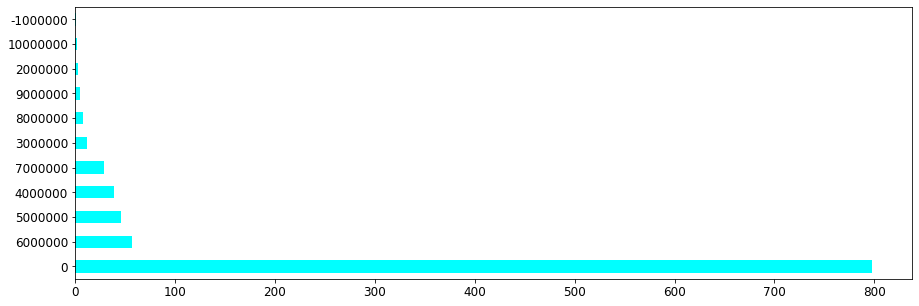

In [653]:
df['umbrella_limit'].value_counts().plot(kind = "barh",fontsize=12,figsize=(15,5),color='aqua')

###### 10. insured_zip variable

<AxesSubplot:>

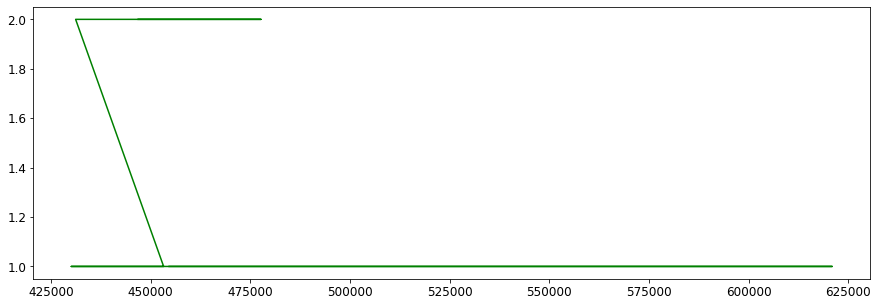

In [654]:
df['insured_zip'].value_counts().plot(kind = "line",fontsize=12,figsize=(15,5),color='green')

###### 11. insured_sex variable

<AxesSubplot:ylabel='insured_sex'>

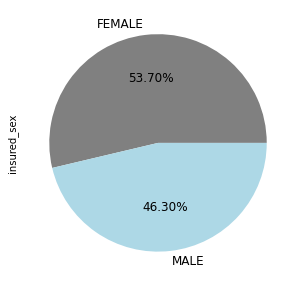

In [655]:
df['insured_sex'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colors = ['grey','lightblue'])

###### 12. insured_education_level variable

<AxesSubplot:ylabel='insured_education_level'>

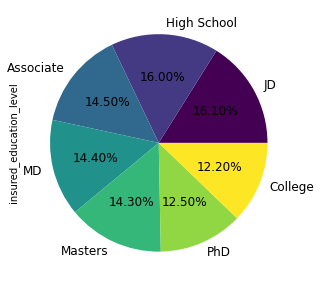

In [656]:
df['insured_education_level'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='viridis')

###### 13. insured_occupation variable

<AxesSubplot:>

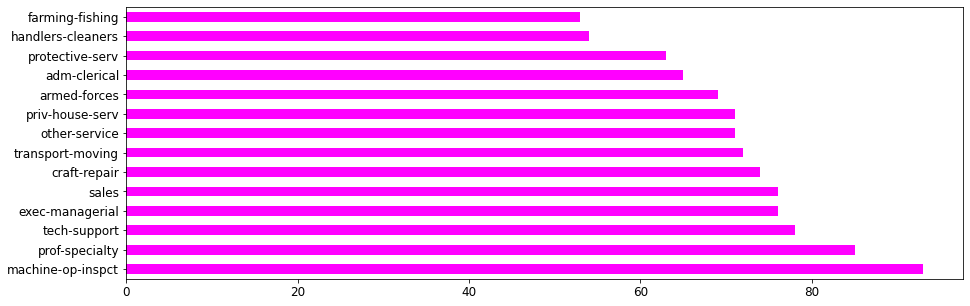

In [657]:
df['insured_occupation'].value_counts().plot(kind = "barh",fontsize=12,figsize=(15,5),color='magenta')

###### 14. insured_hobbies variable

<AxesSubplot:>

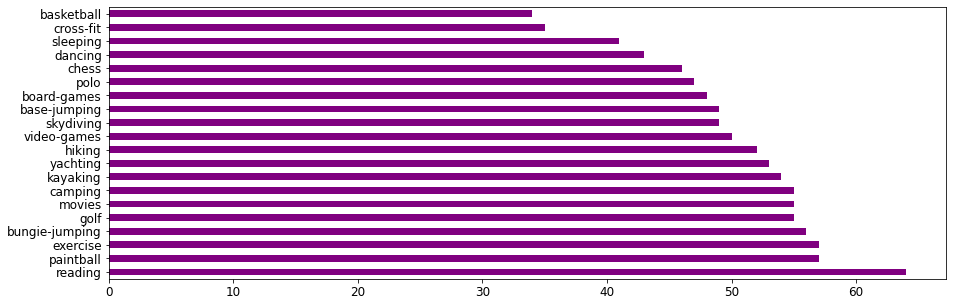

In [658]:
df['insured_hobbies'].value_counts().plot(kind = "barh",fontsize=12,figsize=(15,5),color ='purple')

###### 15. insured_relationship variable

<AxesSubplot:ylabel='insured_relationship'>

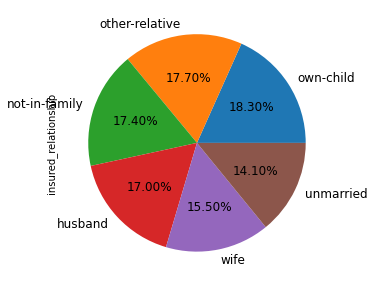

In [659]:
df['insured_relationship'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5))

###### 16. capital-gains variable

<AxesSubplot:>

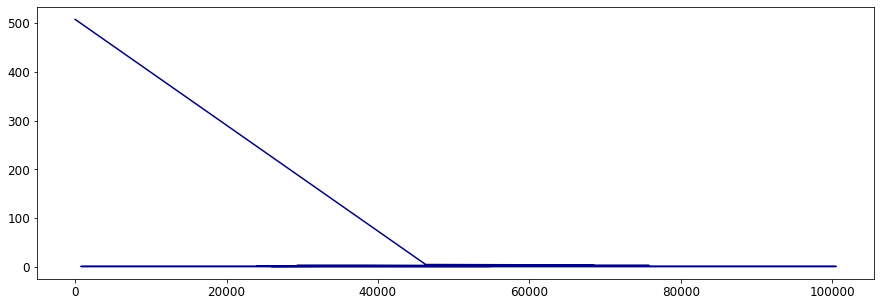

In [660]:
df['capital-gains'].value_counts().plot(kind = "line",fontsize=12,figsize=(15,5),color='navy')

###### 17. capital-loss variable

<AxesSubplot:>

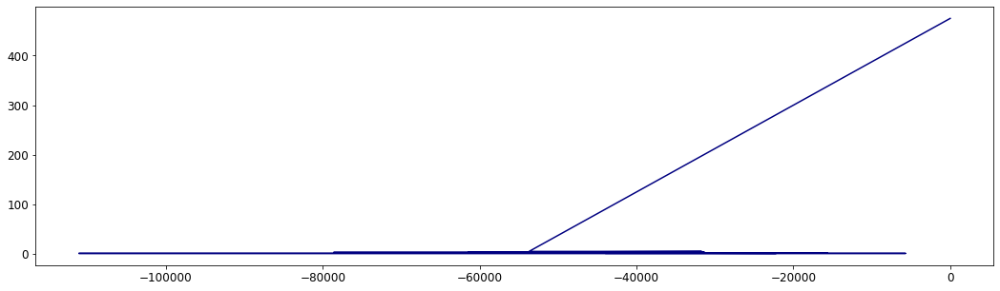

In [661]:
df['capital-loss'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='navy')

###### 18. incident_date variable

<AxesSubplot:>

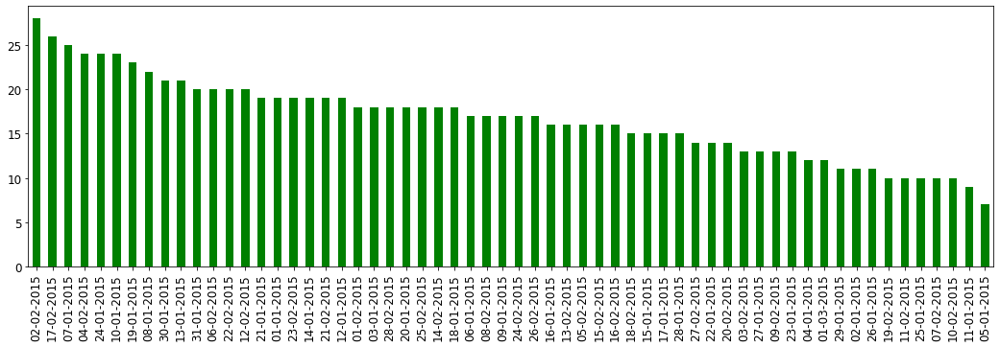

In [662]:
df['incident_date'].value_counts().plot(kind = "bar",fontsize=12,figsize=(18,5),color='green')

###### 19. incident_type variable

<AxesSubplot:ylabel='incident_type'>

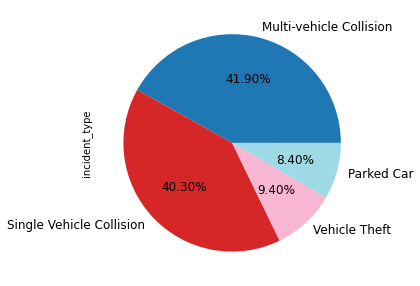

In [663]:
df['incident_type'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='tab20')

###### 20. collision_type variable

<AxesSubplot:ylabel='collision_type'>

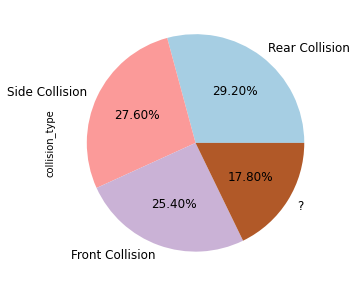

In [664]:
df['collision_type'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='Paired')

###### 21. incident_severity variable

<AxesSubplot:ylabel='incident_severity'>

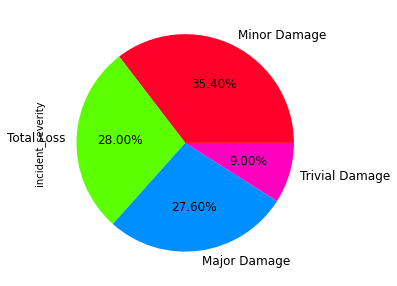

In [665]:
df['incident_severity'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='gist_rainbow')

###### 22. authorities_contacted variable

<AxesSubplot:ylabel='authorities_contacted'>

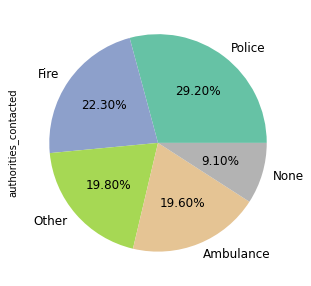

In [666]:
df['authorities_contacted'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='Set2')

###### 23. incident_state variable

<AxesSubplot:>

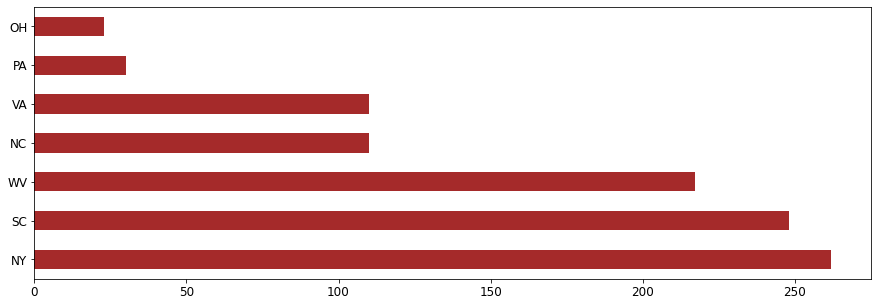

In [667]:
df['incident_state'].value_counts().plot(kind = "barh",fontsize=12,figsize=(15,5),color='brown')

###### 24. incident_city variable

<AxesSubplot:ylabel='incident_city'>

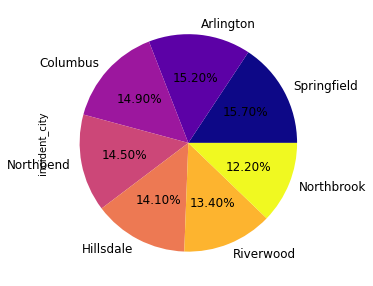

In [668]:
df['incident_city'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='plasma')

###### 25. incident_location variable

<AxesSubplot:>

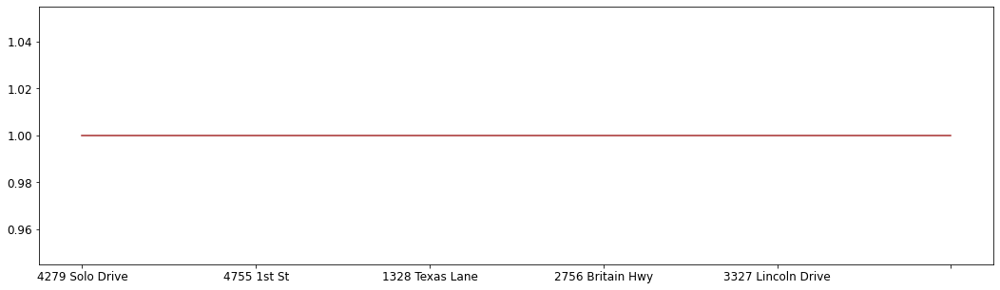

In [669]:
df['incident_location'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='brown')

###### 26. incident_hour_of_the_day variable

<AxesSubplot:>

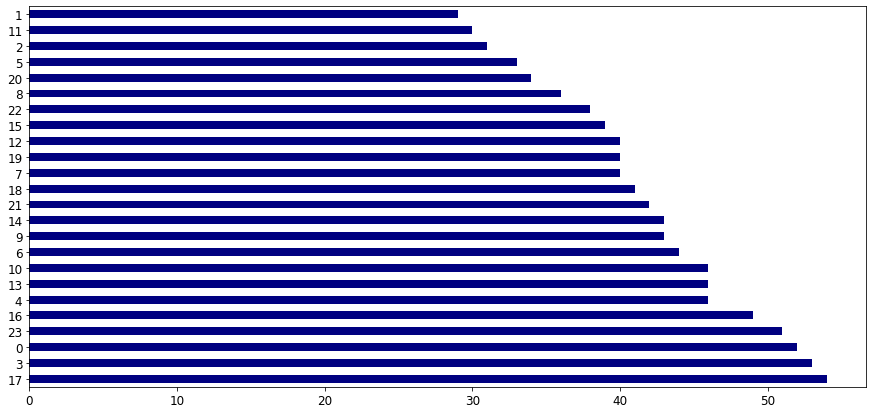

In [670]:
df['incident_hour_of_the_day'].value_counts().plot(kind = "barh",fontsize=12,figsize=(15,7),color='navy')

###### 27. number_of_vehicles_involved variable

<AxesSubplot:ylabel='number_of_vehicles_involved'>

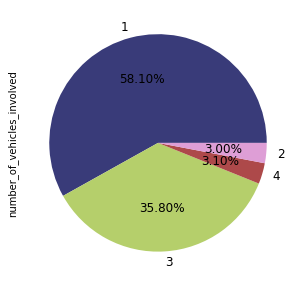

In [671]:
df['number_of_vehicles_involved'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='tab20b')

###### 28. property_damage variable

<AxesSubplot:ylabel='property_damage'>

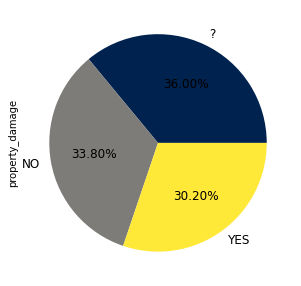

In [672]:
df['property_damage'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='cividis')

###### 29. bodily_injuries variable

<AxesSubplot:ylabel='bodily_injuries'>

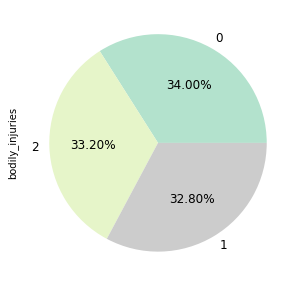

In [673]:
df['bodily_injuries'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='Pastel2')

###### 30. witnesses variable

<AxesSubplot:ylabel='witnesses'>

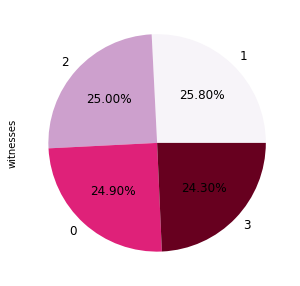

In [674]:
df['witnesses'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='PuRd')

###### 31. police_report_available variable

<AxesSubplot:ylabel='police_report_available'>

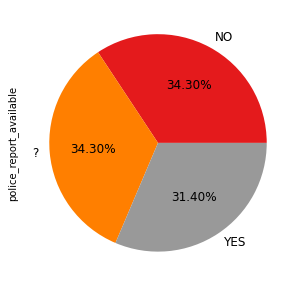

In [675]:
df['police_report_available'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colormap='Set1')

###### 32. total_claim_amount variable

<AxesSubplot:>

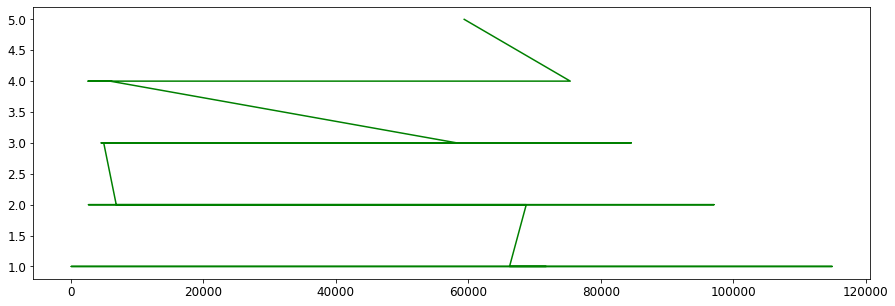

In [676]:
df['total_claim_amount'].value_counts().plot(kind = "line",fontsize=12,figsize=(15,5),color='green')

###### 33. injury_claim variable

<AxesSubplot:>

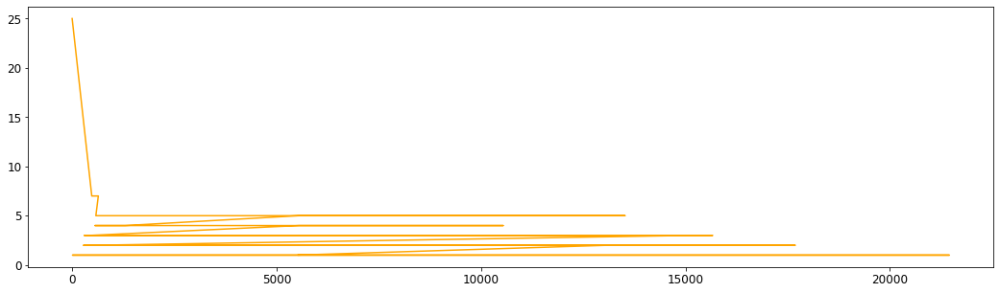

In [677]:
df['injury_claim'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='orange')

###### 34. property_claim variable

<AxesSubplot:>

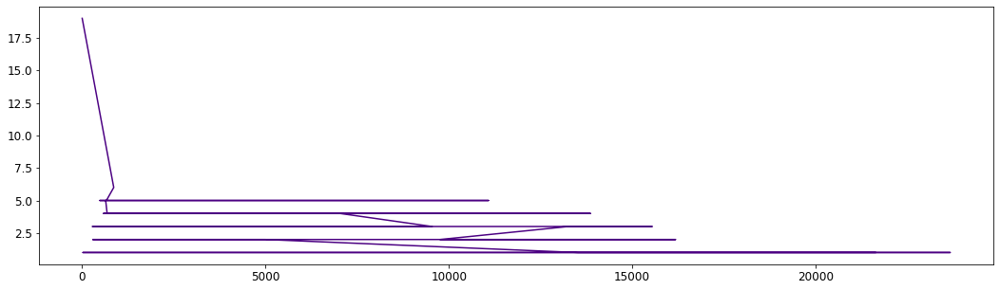

In [678]:
df['property_claim'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='indigo')

###### 35. vehicle_claim variable

<AxesSubplot:>

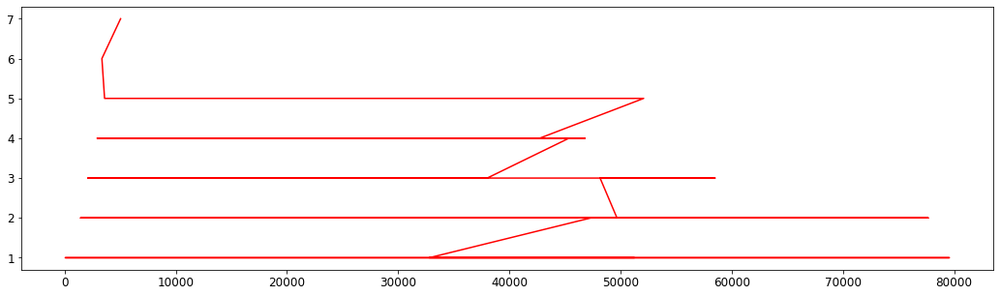

In [679]:
df['vehicle_claim'].value_counts().plot(kind = "line",fontsize=12,figsize=(18,5),color='red')

###### 36. auto_make variable

<AxesSubplot:>

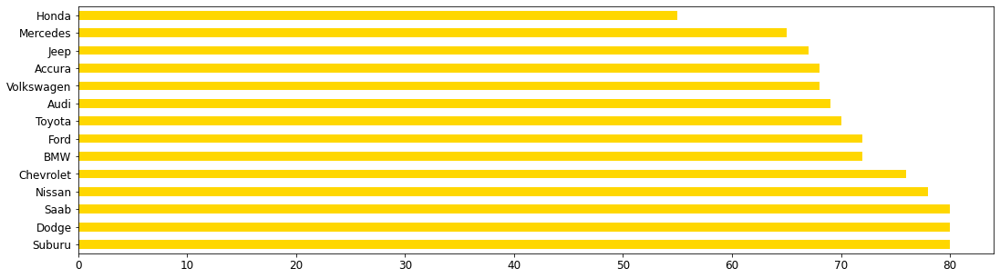

In [680]:
df['auto_make'].value_counts().plot(kind = "barh",fontsize=12,figsize=(18,5),color='gold')

###### 37. auto_model variable

<AxesSubplot:>

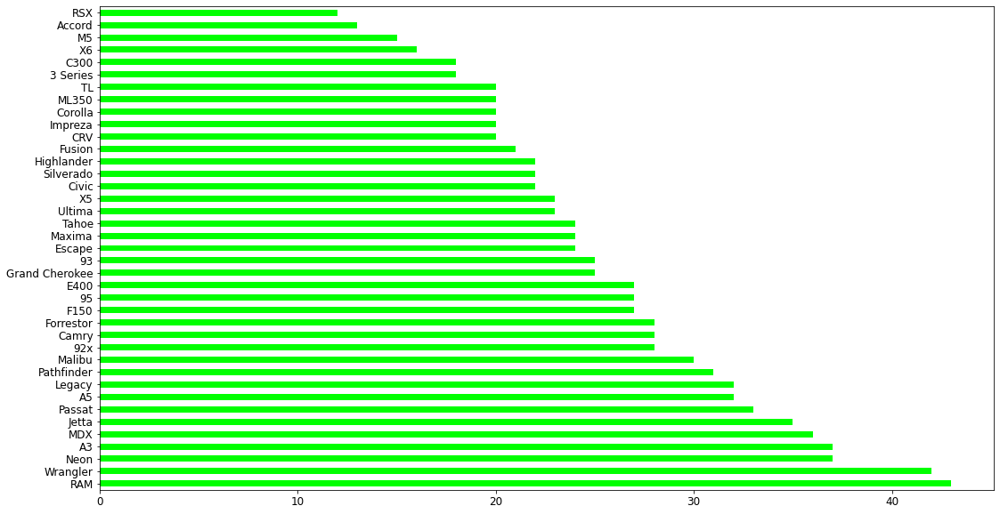

In [681]:
df['auto_model'].value_counts().plot(kind = "barh",fontsize=12,figsize=(18,10),color='lime')

###### 38. auto_year variable

<AxesSubplot:>

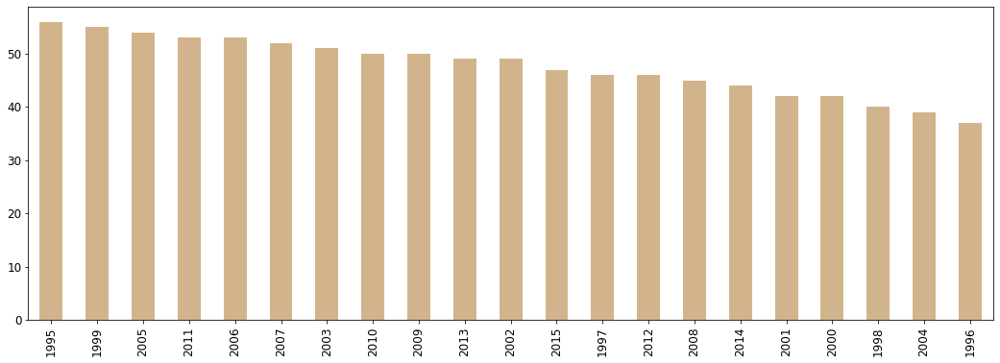

In [682]:
df['auto_year'].value_counts().plot(kind = "bar",fontsize=12,figsize=(18,6),color='tan')

###### 39. fraud_reported variable

<AxesSubplot:ylabel='fraud_reported'>

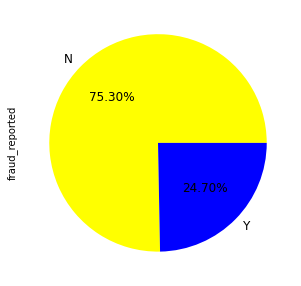

In [683]:
df['fraud_reported'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colors = ['yellow','blue'])

###### 40. _c39 variable

<AxesSubplot:ylabel='_c39'>

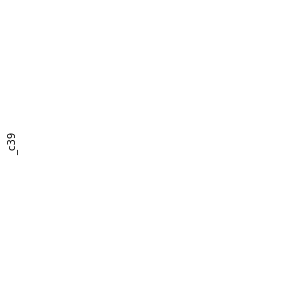

In [684]:
df['_c39'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colors = ['coral','plum'])

###### Bivariate Analysis

###### 1.fraud_reported Vs All variables

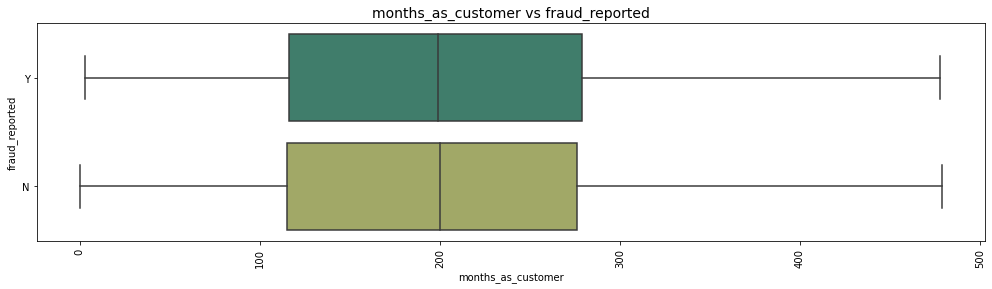

In [685]:
plt.figure(figsize=(17,4))
sns.boxplot(df['months_as_customer'], df['fraud_reported'],  palette='gist_earth')
plt.title('months_as_customer vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

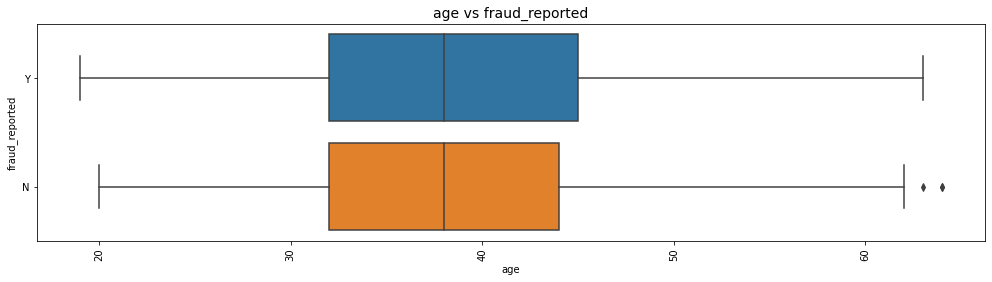

In [686]:
plt.figure(figsize=(17,4))
sns.boxplot(df['age'], df['fraud_reported'],  palette='tab10')
plt.title('age vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

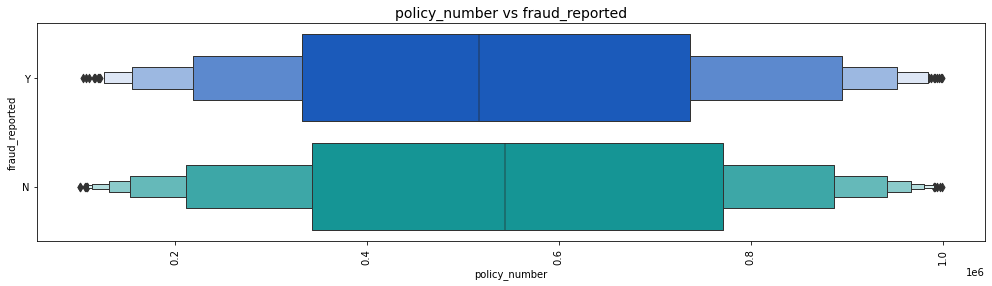

In [687]:
plt.figure(figsize=(17,4))
sns.boxenplot(df['policy_number'], df['fraud_reported'], palette='winter')
plt.title('policy_number vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

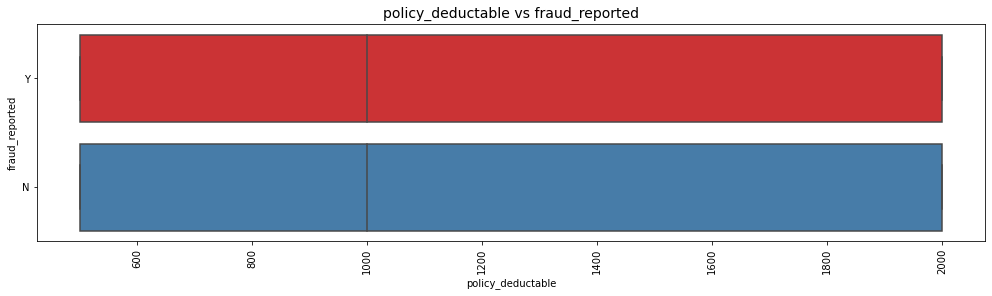

In [688]:
plt.figure(figsize=(17,4))
sns.boxplot(df['policy_deductable'], df['fraud_reported'], palette='Set1')
plt.title('policy_deductable vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

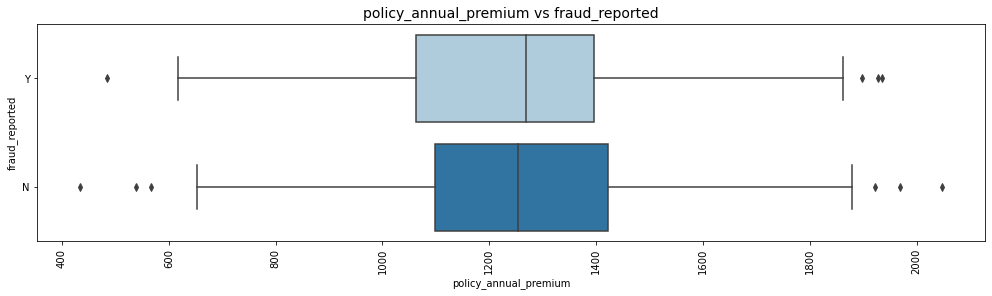

In [689]:
plt.figure(figsize=(17,4))
sns.boxplot(df['policy_annual_premium'], df['fraud_reported'],palette='Paired')
plt.title('policy_annual_premium vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

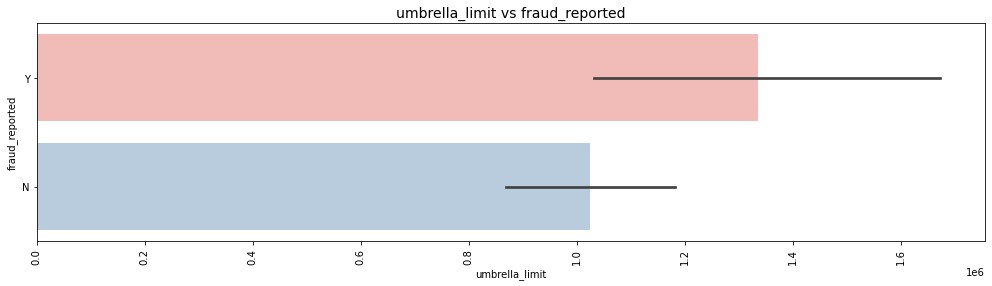

In [690]:
plt.figure(figsize=(17,4))
sns.barplot(df['umbrella_limit'], df['fraud_reported'],  palette='Pastel1')
plt.title('umbrella_limit vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

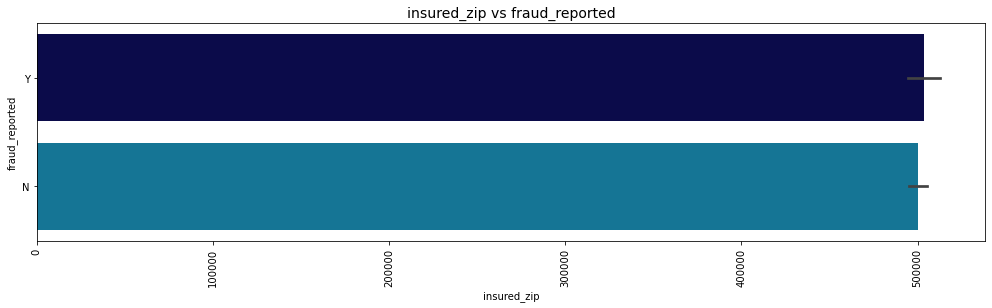

In [691]:
plt.figure(figsize=(17,4))
sns.barplot(df['insured_zip'], df['fraud_reported'],  palette='ocean')
plt.title('insured_zip vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

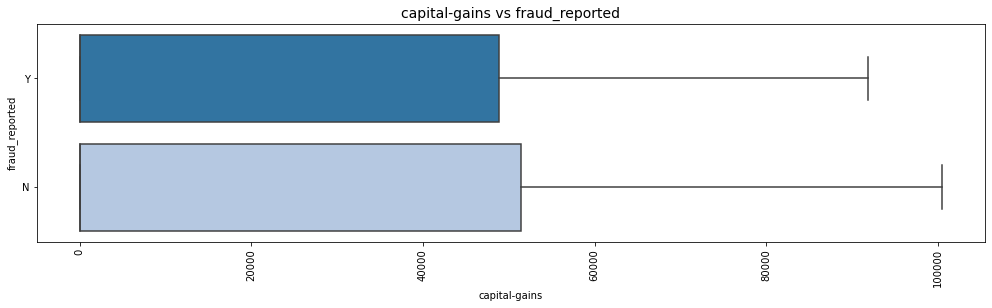

In [692]:
plt.figure(figsize=(17,4))
sns.boxplot(df['capital-gains'], df['fraud_reported'],  palette='tab20')
plt.title('capital-gains vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

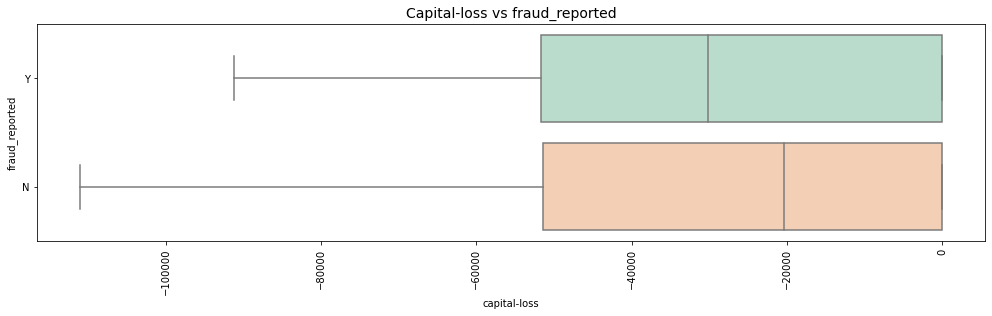

In [693]:
plt.figure(figsize=(17,4))
sns.boxplot(df['capital-loss'], df['fraud_reported'],  palette='Pastel2')
plt.title('Capital-loss vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

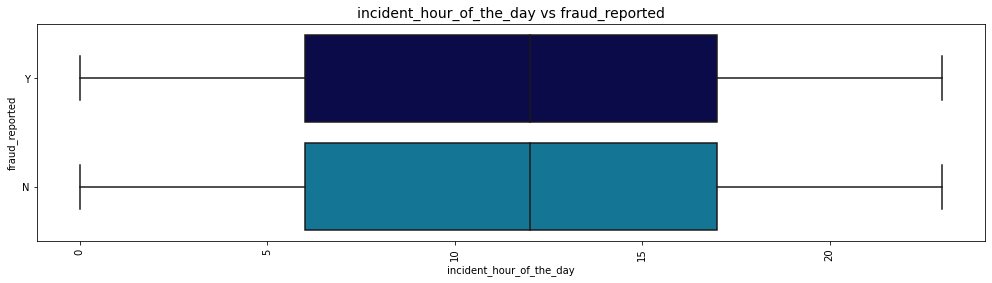

In [694]:
plt.figure(figsize=(17,4))
sns.boxplot(df['incident_hour_of_the_day'], df['fraud_reported'],  palette='ocean')
plt.title('incident_hour_of_the_day vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

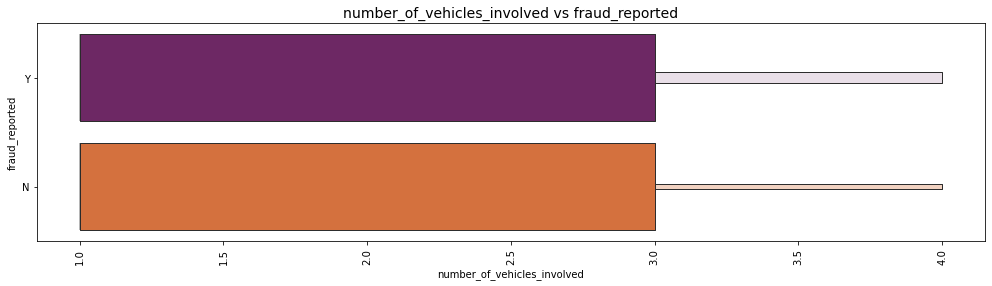

In [695]:
plt.figure(figsize=(17,4))
sns.boxenplot(df['number_of_vehicles_involved'], df['fraud_reported'],  palette='inferno')
plt.title('number_of_vehicles_involved vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

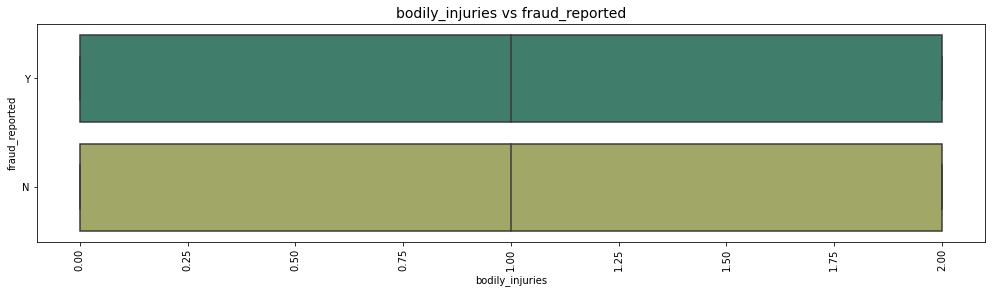

In [696]:
plt.figure(figsize=(17,4))
sns.boxplot(df['bodily_injuries'], df['fraud_reported'],  palette='gist_earth')
plt.title('bodily_injuries vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

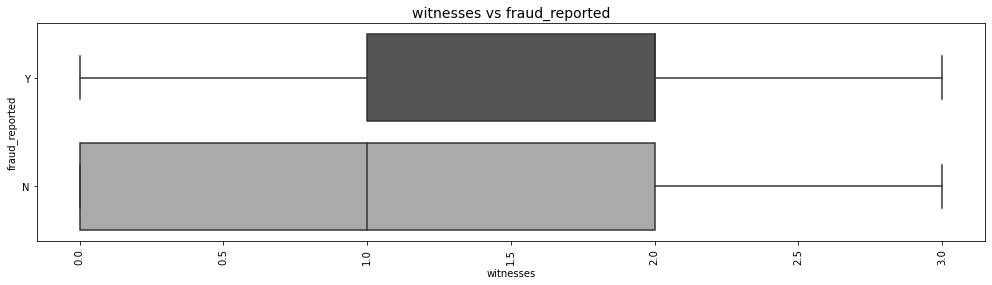

In [697]:
plt.figure(figsize=(17,4))
sns.boxplot(df['witnesses'], df['fraud_reported'],  palette='binary_r')
plt.title('witnesses vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

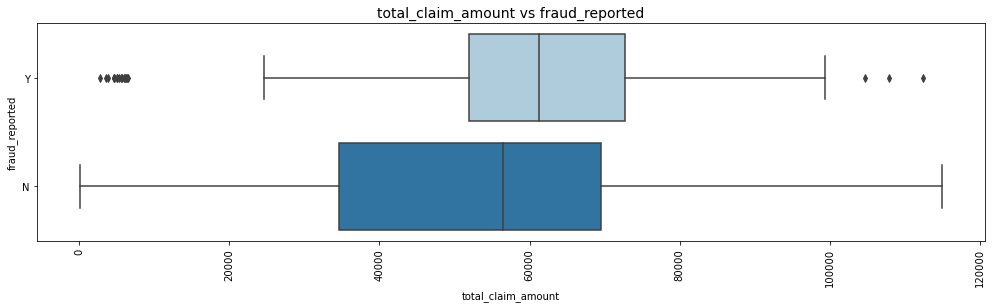

In [698]:
plt.figure(figsize=(17,4))
sns.boxplot(df['total_claim_amount'], df['fraud_reported'],  palette='Paired')
plt.title('total_claim_amount vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

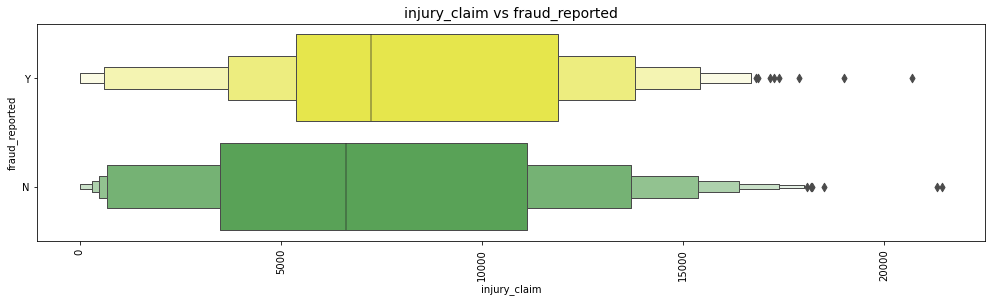

In [699]:
plt.figure(figsize=(17,4))
sns.boxenplot(df['injury_claim'], df['fraud_reported'],  palette='Set1_r')
plt.title('injury_claim vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

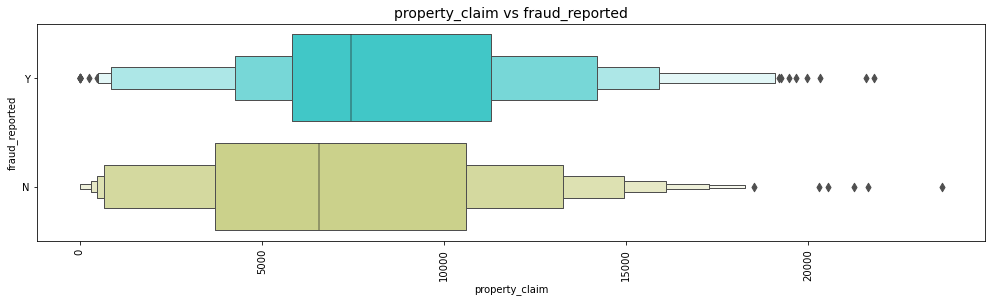

In [700]:
plt.figure(figsize=(17,4))
sns.boxenplot(df['property_claim'], df['fraud_reported'],  palette='rainbow')
plt.title('property_claim vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

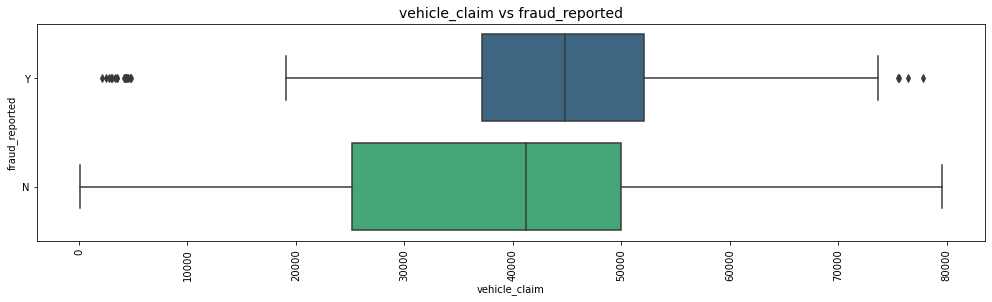

In [701]:
plt.figure(figsize=(17,4))
sns.boxplot(df['vehicle_claim'], df['fraud_reported'],  palette='viridis')
plt.title('vehicle_claim vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

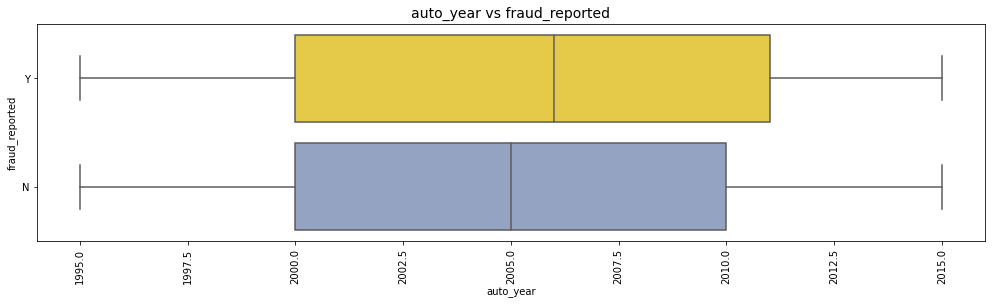

In [702]:
plt.figure(figsize=(17,4))
sns.boxplot(df['auto_year'], df['fraud_reported'],  palette='Set2_r')
plt.title('auto_year vs fraud_reported', size=14)
plt.xticks(rotation=90)
plt.show()

###### Multivariate Analysis

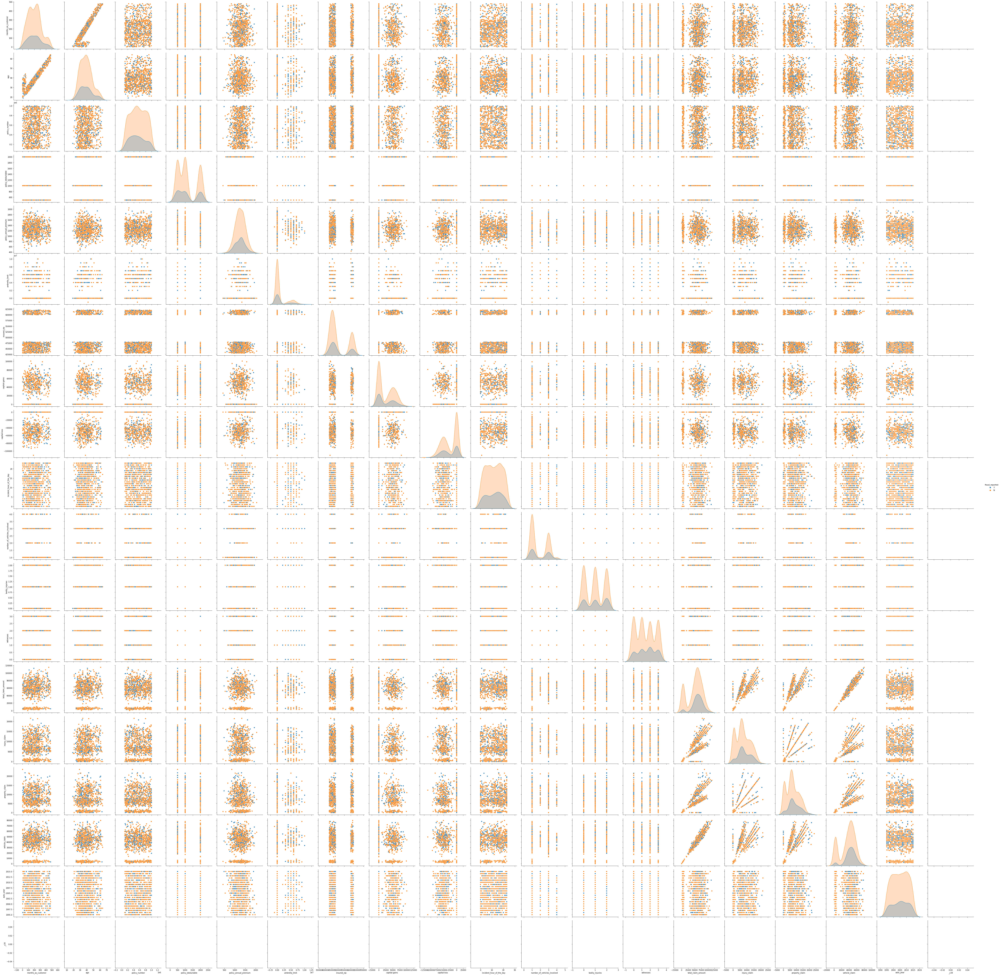

In [456]:
sns.pairplot(df,hue='fraud_reported',height=4)

###### Handling Outliers

In [811]:
fout =['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim']
for f in fout:
    q1 = df[f].quantile(0.25)
    q3 = df[f].quantile(0.75)
    IQR = q3-q1
    lolimit = q1 - (IQR*1.5)
    uplimit = q3 + (IQR*1.5)
    df.loc[df[f]<lolimit,f] = lolimit
    df.loc[df[f]>uplimit,f] = uplimit

In [812]:
#Recheck for Outliers After Removing

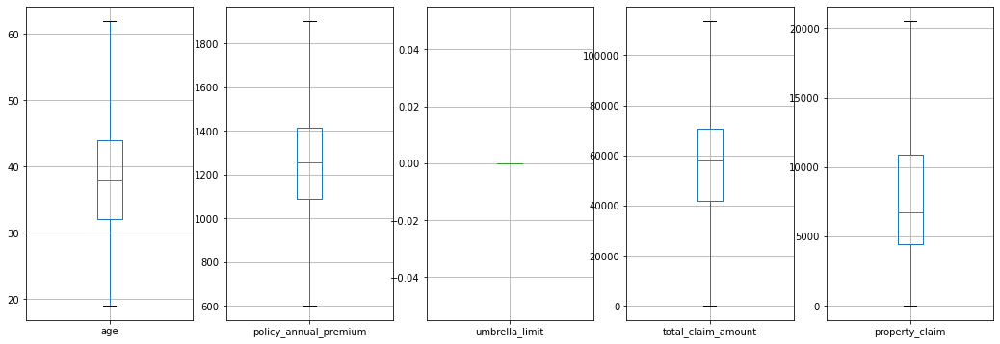

In [813]:
col1=['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim']
fig, pltcan=plt.subplots(nrows=1, ncols=len(col1), figsize=(18,6))
for predcol , i in zip(col1, range(len(col1))):
    df.boxplot(column=predcol, figsize=(2,10), vert=True, ax=pltcan[i])

In [814]:
df.shape

(1000, 40)

###### Handling Missing/Zeros Values

In [815]:
df.drop(['_c39','umbrella_limit'],inplace=True,axis=1)

###### Encoding categorical variable

In [816]:
df[['policy_dd','policy_mm','policy_yyyy']]=df['policy_bind_date'].str.split('-',expand=True)
df.drop(['policy_bind_date'],inplace=True,axis=1)
df["policy_dd"]= df["policy_dd"].astype(int)
df["policy_mm"]= df["policy_mm"].astype(int)
df["policy_yyyy"]= df["policy_yyyy"].astype(int)

In [817]:
df[['policycsl_num','policycsl_dem']]=df['policy_csl'].str.split('/',expand=True)
df.drop(['policy_csl'],inplace=True,axis=1)
df["policycsl_num"]= df["policycsl_num"].astype(int)
df["policycsl_dem"]= df["policycsl_dem"].astype(int)

In [818]:
df[['incident_no','incident_path','incident_area']]=df['incident_location'].str.split(' ',expand=True)
df.drop(['incident_location'],inplace=True,axis=1)
df["incident_no"]= df["incident_no"].astype(int)
df['incident_path']=le.fit_transform(df['incident_path'])
df['incident_area']=le.fit_transform(df['incident_area'])

In [820]:
df[['incident_dd','incident_mm','incident_yyyy']]=df['incident_date'].str.split('-',expand=True)
df.drop(['incident_date'],inplace=True,axis=1)
df["incident_dd"]= df["incident_dd"].astype(int)
df["incident_mm"]= df["incident_mm"].astype(int)
df["incident_yyyy"]= df["incident_yyyy"].astype(int)

In [821]:
le=LabelEncoder()
df['policy_state']=le.fit_transform(df['policy_state'])
df['insured_sex']=le.fit_transform(df['insured_sex'])
df['insured_education_level']=le.fit_transform(df['insured_education_level'])
df['insured_occupation']=le.fit_transform(df['insured_occupation'])
df['insured_hobbies']=le.fit_transform(df['insured_hobbies'])
df['insured_relationship']=le.fit_transform(df['insured_relationship'])
df['incident_type']=le.fit_transform(df['incident_type'])
df['collision_type']=le.fit_transform(df['collision_type'])
df['incident_severity']=le.fit_transform(df['incident_severity'])
df['authorities_contacted']=le.fit_transform(df['authorities_contacted'])
df['incident_state']=le.fit_transform(df['incident_state'])
df['incident_city']=le.fit_transform(df['incident_city'])
df['property_damage']=le.fit_transform(df['property_damage'])
df['auto_make']=le.fit_transform(df['auto_make'])
df['auto_model']=le.fit_transform(df['auto_model'])
df['fraud_reported']=le.fit_transform(df['fraud_reported'])

In [822]:
df.police_report_available.replace({'YES':1,'NO':0,'?':0},inplace=True)
df["police_report_available"]= df["police_report_available"].astype(int)

In [823]:
df.head()

,months_as_customer,age,policy_number,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_dd,policy_mm,policy_yyyy,policycsl_num,policycsl_dem,incident_no,incident_path,incident_area,incident_dd,incident_mm,incident_yyyy
0,328,48.0,521585,2,1000,1406.91,466132,1,4,2,17,0,53300,0,2,3,0,4,4,1,5,1,2,1,2,1,71610.0,6510,13020.0,52080,10,1,2004,1,17,10,2014,250,500,9935,3,1,25,1,2015
1,228,42.0,342868,1,2000,1197.22,468176,1,4,6,15,2,0,0,3,0,1,4,5,5,8,1,0,0,0,0,5070.0,780,780.0,3510,8,12,2007,1,27,6,2006,250,500,6608,15,2,21,1,2015
2,134,29.0,687698,2,2000,1413.14,430632,0,6,11,2,3,35100,0,0,2,1,4,1,1,7,3,1,2,3,0,34650.0,7700,3850.0,23100,4,30,2007,0,6,9,2000,100,300,7121,13,3,22,2,2015
3,256,41.0,227811,0,2000,1415.74,608117,0,6,1,2,4,48900,-62400,2,1,0,4,2,0,5,1,0,1,2,0,63400.0,6340,6340.0,50720,3,34,2014,1,25,5,1990,250,500,6956,16,1,10,1,2015
4,228,44.0,367455,0,1000,1583.91,610706,1,0,11,2,4,66000,-46000,3,0,1,2,1,0,20,1,1,0,1,0,6500.0,1300,650.0,4550,0,31,2009,0,6,6,2014,500,1000,3041,2,0,17,2,2015


In [824]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 45 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   float64
 2   policy_number                1000 non-null   int64  
 3   policy_state                 1000 non-null   int32  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   insured_zip                  1000 non-null   int64  
 7   insured_sex                  1000 non-null   int32  
 8   insured_education_level      1000 non-null   int32  
 9   insured_occupation           1000 non-null   int32  
 10  insured_hobbies              1000 non-null   int32  
 11  insured_relationship         1000 non-null   int32  
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

###### Handling Skewness

In [830]:
df[['insured_zip']]= np.sqrt(df[['insured_zip']])
df[['police_report_available']]= np.sqrt(df[['police_report_available']])
df[['total_claim_amount']]= np.sqrt(df[['total_claim_amount']])
df[['vehicle_claim']]= np.sqrt(df[['vehicle_claim']])
df[['fraud_reported']]= np.sqrt(df[['fraud_reported']])
df[['policycsl_dem']]= np.sqrt(df[['policycsl_dem']])

In [831]:
df.skew()

months_as_customer             0.362177
age                            0.469878
policy_number                  0.038991
policy_state                  -0.026177
policy_deductable              0.477887
policy_annual_premium          0.016003
insured_zip                    0.787070
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.106418
bodily_injuries                0.014777
witnesses                      0.019636


In [832]:
df.shape

(1000, 45)

###### Feature Selection

In [842]:
# Check Strongly Related Features  in train dataset
cor = df.corr()
cor_target = abs(cor["fraud_reported"])
strong_related = cor_target[cor_target>0.040]
print("Strongly Related:\n\n",strong_related,"\n")

weak_related = cor_target[cor_target<0.040]
print("Weak Relates:\n\n",weak_related)

Strongly Related:

 insured_hobbies                0.046838
incident_type                  0.050376
collision_type                 0.110130
incident_severity              0.405988
authorities_contacted          0.045802
incident_state                 0.051407
incident_city                  0.040403
number_of_vehicles_involved    0.051839
witnesses                      0.049497
total_claim_amount             0.173958
injury_claim                   0.090975
property_claim                 0.138192
vehicle_claim                  0.176730
fraud_reported                 1.000000
policy_dd                      0.063040
policycsl_num                  0.040835
policycsl_dem                  0.040016
incident_dd                    0.045955
Name: fraud_reported, dtype: float64 

Weak Relates:

 months_as_customer          0.020544
age                         0.012287
policy_number               0.029443
policy_state                0.029432
policy_deductable           0.014817
policy_annual_premiu

In [840]:
# Anova Test 
sp1=[]
sp2=[]
for i in df.columns:
    cg=df.groupby('fraud_reported')[i].apply(list)
    av=stats.f_oneway(*cg)
    if av[1]<0.5:
        print(i,'------correlated------:',av[1],'\n')
        sp1.append(i)
    else:
        print(i,'------not correlated-----:',av[1],'\n')
        sp2.append(i)

months_as_customer ------not correlated-----: 0.5164037490551091 

age ------not correlated-----: 0.6979627558963344 

policy_number ------correlated------: 0.35231793671623 

policy_state ------correlated------: 0.35250211872793835 

policy_deductable ------not correlated-----: 0.6397807865912086 

policy_annual_premium ------not correlated-----: 0.6528852029044141 

insured_zip ------correlated------: 0.4932010348663206 

insured_sex ------correlated------: 0.3294105163571729 

insured_education_level ------not correlated-----: 0.7808619570108887 

insured_occupation ------not correlated-----: 0.9606107753117721 

insured_hobbies ------correlated------: 0.13884321683106138 

insured_relationship ------not correlated-----: 0.5062476030567362 

capital-gains ------not correlated-----: 0.5447871071163393 

capital-loss ------not correlated-----: 0.6387475334929109 

incident_type ------correlated------: 0.11137101033302986 

collision_type ------correlated------: 0.00048508114569706785 

###### split target and feature variables

In [835]:
y_train=df[['fraud_reported']]
X_train=df.drop(['fraud_reported'],axis=1)

print("y_train :",y_train.shape)
print("X_train :",X_train.shape)

y_train : (1000, 1)
X_train : (1000, 44)


[0.02101888 0.02018879 0.02076965 0.02047527 0.01814333 0.02170025
 0.02317827 0.01456049 0.02112504 0.02251736 0.02995525 0.01965992
 0.01843513 0.01834505 0.01410969 0.01977183 0.14532764 0.02060969
 0.02069508 0.02016676 0.02165757 0.01394759 0.01847977 0.01915838
 0.02118148 0.01316185 0.02370016 0.02225087 0.02622548 0.02426629
 0.02069097 0.02063328 0.02159213 0.02362365 0.02227749 0.02127014
 0.01630876 0.0151442  0.02188159 0.02262901 0.01973125 0.0205308
 0.01890395 0.        ]


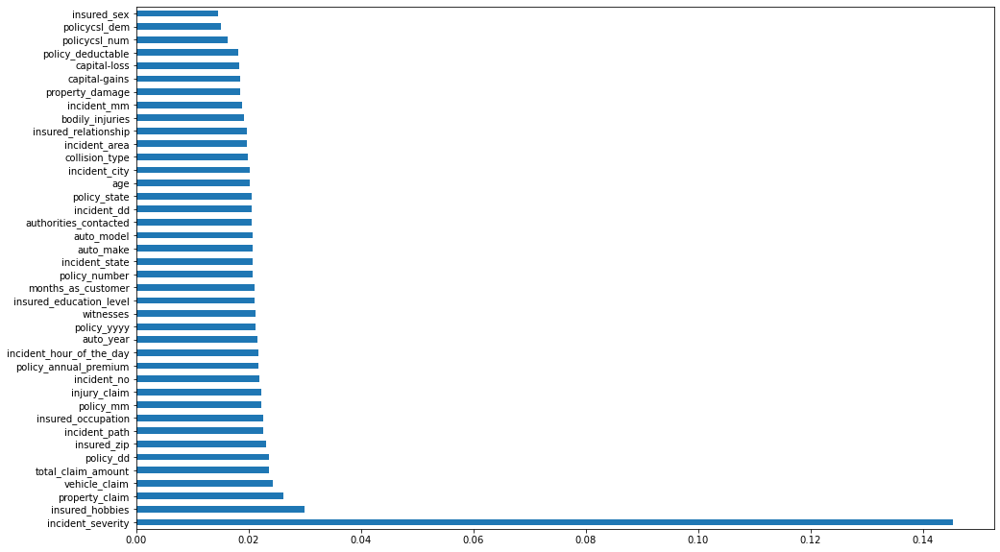

In [837]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X_train,y_train)
print(model.feature_importances_) 
feat_importances = pd.Series(model.feature_importances_, index=X_train.columns)
feat_importances.nlargest(40).plot(kind='barh',figsize=(16,10))
plt.show()

In [843]:
X_train.drop(['months_as_customer','age','policy_state','policy_deductable','insured_zip','insured_sex',
         'insured_education_level','insured_relationship','capital-gains','capital-loss',
         'incident_hour_of_the_day','auto_make','auto_model','auto_year','incident_no','incident_area',
         'incident_mm','incident_yyyy'],inplace=True,axis=1)

###### selected features

In [844]:
X_train.columns

Index(['policy_number', 'policy_annual_premium', 'insured_occupation',
       'insured_hobbies', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'number_of_vehicles_involved', 'property_damage',
       'bodily_injuries', 'witnesses', 'police_report_available',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'policy_dd', 'policy_mm', 'policy_yyyy', 'policycsl_num',
       'policycsl_dem', 'incident_path', 'incident_dd'],
      dtype='object')

In [845]:
y_train.columns

Index(['fraud_reported'], dtype='object')

###### Target Variable is Unbalanced

<AxesSubplot:ylabel='fraud_reported'>

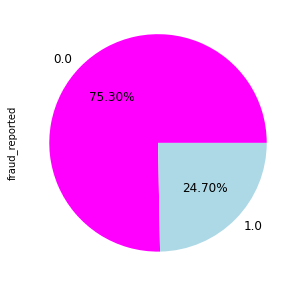

In [850]:
df['fraud_reported'].value_counts().plot(kind = "pie",autopct='%1.2f%%',fontsize=12,figsize=(5,5),colors = ['magenta','lightblue'])

In [851]:
#balance TArget

In [852]:
# define dataset
X_train, y_train = make_classification(n_samples=10000, weights=[0.99], flip_y=0)
smote = SMOTE()
x_smote, y_smote = smote.fit_resample(X_train, y_train)
  
# print the features and the labels
print('x_smote:\n', x_smote.shape)
print('y_smote:\n', y_smote.shape)

x_smote:
 (19800, 20)
y_smote:
 (19800,)


###### Normalization

In [853]:
from sklearn.preprocessing import power_transform
X=power_transform(x_smote,method='yeo-johnson')
X

array([[ 0.579132  ,  0.46303643,  1.24320359, ...,  0.87790855,
         0.35290025, -1.82229172],
       [-0.29249023, -0.32099069,  0.04012972, ...,  0.3556348 ,
         0.47776998, -0.58272056],
       [-0.37651901,  0.46748895,  0.09084329, ..., -1.00492909,
         1.29543672,  0.9583124 ],
       ...,
       [ 1.65320165, -0.75633349,  0.44876299, ..., -1.63925411,
        -1.22604299,  1.33462181],
       [ 0.77902326, -0.97682843, -1.55484973, ..., -0.75802498,
         0.34125754, -0.86453842],
       [-0.07181104,  0.71113218, -1.62444039, ..., -0.4243363 ,
        -0.20328618, -0.75504444]])

###### Splitting Dataset into train and test set

In [854]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size = 0.25, random_state = 44)
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(14850, 20)
(14850,)
(4950, 20)
(4950,)


###### Sandardization of data

In [855]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
print(x_train)
x_test = sc.fit_transform(x_test)
print(x_test)

[[ 0.7997008   0.68190212  0.7714773  ... -1.50483776 -1.16987868
  -1.31776339]
 [-1.08688076 -0.05107516  0.74807149 ... -3.45051051  0.01965205
  -1.25085668]
 [ 1.97385337 -0.52119947 -0.01054259 ... -1.34969165  0.61515858
  -0.38303871]
 ...
 [-1.0736758   0.18654214 -0.20286341 ...  1.34664739 -0.24382702
  -1.05816296]
 [-0.72118545 -0.99311483  1.1128472  ... -0.44214918 -1.12071873
  -0.01935255]
 [ 0.12003506  0.97926906 -2.58727682 ...  1.19254764  0.76938816
  -0.47242961]]
[[ 0.06336286  1.31678204  1.14401234 ...  1.7354551   1.19576724
  -0.94890451]
 [-0.26120766 -0.2489032  -0.07983833 ...  0.60367109 -0.64044964
   1.27134358]
 [-1.48090707  0.53028672 -0.21089626 ...  0.20629835  1.10558694
   0.15796563]
 ...
 [ 1.60017836  0.08554055 -1.71303868 ...  0.37458229  1.22896436
  -1.29972573]
 [-0.0994886   0.05476762 -0.01386268 ... -0.14225422  2.07465196
   1.11836939]
 [ 0.78470348  1.17512277  0.17858837 ... -0.47090638  0.04172041
  -1.50712645]]


###### Model Building

In [857]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score,roc_curve,auc, roc_auc_score
from sklearn.model_selection import RandomizedSearchCV, cross_val_score

from sklearn.metrics import precision_score, recall_score, precision_recall_fscore_support
from sklearn.metrics import f1_score,precision_recall_curve

In [858]:
models=[]
models1 = []

Z = [DecisionTreeClassifier() , LogisticRegression() , KNeighborsClassifier() ,
    RandomForestClassifier() , GradientBoostingClassifier(),AdaBoostClassifier()] #,SVC(probability=True) ]
X = ["DecisionTreeClassifier" , "LogisticRegression" , "KNeighborsClassifier" ,
    "RandomForestClassifier" , "GradientBoostingClassifier","AdaBoostClassifier"]
for i in range(0,len(Z)):
    model = Z[i]
    model=model.fit( x_train , y_train )
    pred = model.predict(x_test)
    models.append(accuracy_score(pred , y_test))
    models1.append(model.score(x_train , y_train))

In [859]:
d = {"Training Accuracy":models1,"Testing Accuracy" : models}
data_frame = pd.DataFrame(d,index=X)
data_frame

,Training Accuracy,Testing Accuracy
DecisionTreeClassifier,1.000000,0.975960
LogisticRegression,0.922626,0.922020
KNeighborsClassifier,0.972391,0.960808
RandomForestClassifier,1.000000,0.992929
GradientBoostingClassifier,0.979192,0.972525
AdaBoostClassifier,0.957037,0.947879


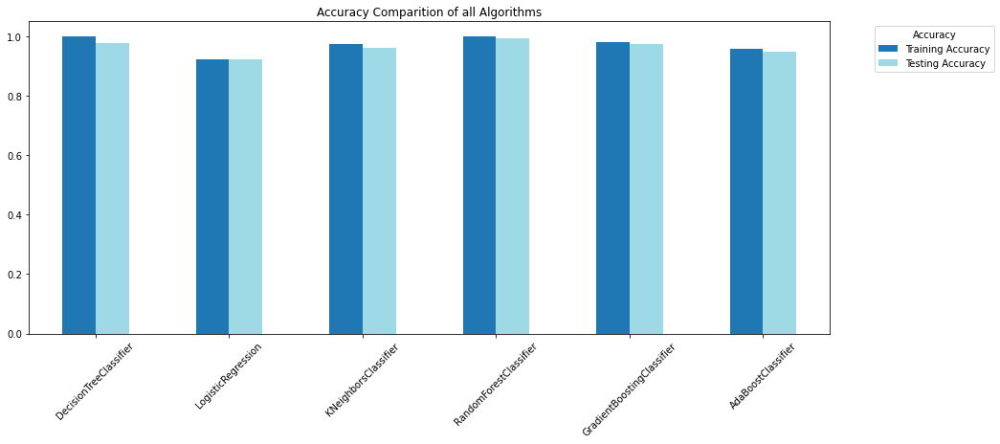

In [864]:
data_frame.plot(kind='bar',figsize=(15,6),title='Accuracy Comparition of all Algorithms',colormap='tab20')
plt.legend(title = 'Accuracy',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

###### Evaluation

In [ ]:
#Classification Report

In [865]:
models2=[]
models3=[]
for i in range(0,len(Z)):
    model = Z[i]
    model=model.fit( x_train , y_train )
    pred = model.predict(x_test)
    Class_Report=metrics.classification_report(y_test, pred)
    models2.append(Class_Report)
    print("Model Name :",model,"\n",Class_Report)
    f1sc=metrics.f1_score(y_test, pred, average='weighted')
    models3.append(f1sc)
    print("Testing Accuracy of Data with Model",model,":",round(f1sc,2),"\n")

Model Name : DecisionTreeClassifier() 
               precision    recall  f1-score   support

           0       0.99      0.97      0.98      2464
           1       0.97      0.99      0.98      2486

    accuracy                           0.98      4950
   macro avg       0.98      0.98      0.98      4950
weighted avg       0.98      0.98      0.98      4950

Testing Accuracy of Data with Model DecisionTreeClassifier() : 0.98 

Model Name : LogisticRegression() 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92      2464
           1       0.92      0.92      0.92      2486

    accuracy                           0.92      4950
   macro avg       0.92      0.92      0.92      4950
weighted avg       0.92      0.92      0.92      4950

Testing Accuracy of Data with Model LogisticRegression() : 0.92 

Model Name : KNeighborsClassifier() 
               precision    recall  f1-score   support

           0       1.00      0.92      0.

In [866]:
d2 = {"Accuracy of Testing Data" : models3}
data_frame2 = pd.DataFrame(d2,index=X)
data_frame2

,Accuracy of Testing Data
DecisionTreeClassifier,0.978785
LogisticRegression,0.922021
KNeighborsClassifier,0.960741
RandomForestClassifier,0.993333
GradientBoostingClassifier,0.972521
AdaBoostClassifier,0.947878


In [ ]:
# Confusion Matrix

In [867]:
cmodel=[]
for i in range(0,len(Z)):
    model = Z[i]
    model=model.fit( x_train , y_train )
    pred = model.predict(x_test)
    cm = np.array(confusion_matrix(y_test, pred, labels=[1,0]))
    cmodel.append(cm)
dc={"Confusion Matrix":cmodel}    
conf_mat=pd.DataFrame(dc,index=X)
conf_mat

,Confusion Matrix
DecisionTreeClassifier,"[[2451, 35], [76, 2388]]"
LogisticRegression,"[[2286, 200], [186, 2278]]"
KNeighborsClassifier,"[[2486, 0], [194, 2270]]"
RandomForestClassifier,"[[2483, 3], [28, 2436]]"
GradientBoostingClassifier,"[[2443, 43], [93, 2371]]"
AdaBoostClassifier,"[[2360, 126], [132, 2332]]"


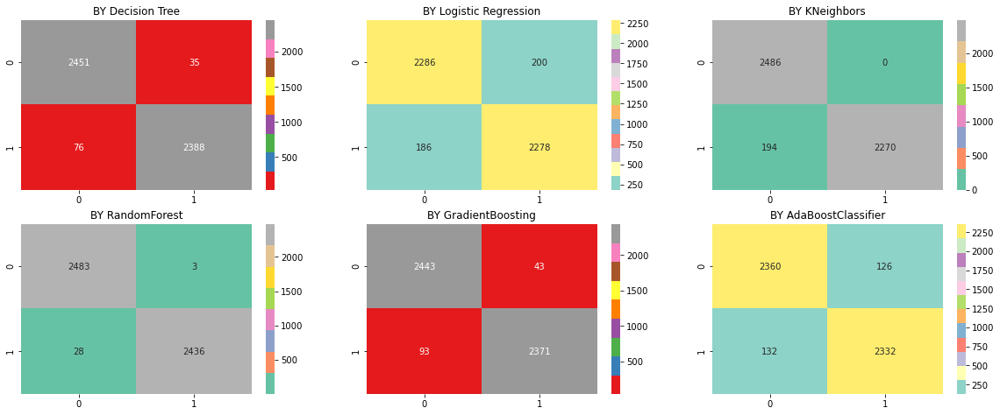

In [870]:
plt.figure(figsize=(20,25))
#plt.subplot(7,3,1)
#sns.heatmap(cmodel[0],annot=True,fmt='g',cmap='Set2')
#plt.title("BY SVC")
plt.subplot(6,3,1)
sns.heatmap(cmodel[0],annot=True,fmt='g',cmap='Set1')
plt.title("BY Decision Tree")
plt.subplot(6,3,2)
sns.heatmap(cmodel[1],annot=True,fmt='g',cmap='Set3')
plt.title("BY Logistic Regression")
plt.subplot(6,3,3)
sns.heatmap(cmodel[2],annot=True,fmt='g',cmap='Set2')
plt.title("BY KNeighbors")  
plt.subplot(6,3,4)
sns.heatmap(cmodel[3],annot=True,fmt='g',cmap='Set2')
plt.title("BY RandomForest")
plt.subplot(6,3,5)
sns.heatmap(cmodel[4],annot=True,fmt='g',cmap='Set1')
plt.title("BY GradientBoosting")
plt.subplot(6,3,6)
sns.heatmap(cmodel[5],annot=True,fmt='g',cmap='Set3')
plt.title("BY AdaBoostClassifier")
plt.show()   

###### Validation

In [ ]:
#Cross validation

In [871]:
vmodel=[]
acvalmodel=[]
for i in range(0,len(Z)):
    model = Z[i]
    model.fit( x_train , y_train )
    pred = model.predict(x_test)
    acval=cross_val_score(model,x_train , y_train, cv=10, scoring='f1_weighted')
    acvalmodel.append(acval)
    print('\n',model,' 10-fold Cross Validation:')
    print('Accuracy value :',acval)
    vmodel.append(round(acval.mean(),2))
    print('Final Average Accuracy :',round(acval.mean(),3))


 DecisionTreeClassifier()  10-fold Cross Validation:
Accuracy value : [0.97305982 0.97036674 0.97440899 0.9804706  0.98114187 0.98114444
 0.97575696 0.97171484 0.97238424 0.98518396]
Final Average Accuracy : 0.977

 LogisticRegression()  10-fold Cross Validation:
Accuracy value : [0.92187348 0.91245442 0.9292928  0.91511094 0.93333212 0.92254424
 0.91985151 0.92727273 0.9077411  0.93063879]
Final Average Accuracy : 0.922

 KNeighborsClassifier()  10-fold Cross Validation:
Accuracy value : [0.95004935 0.95072759 0.95885655 0.95208366 0.95682593 0.96291487
 0.96020761 0.96223682 0.96291302 0.95546893]
Final Average Accuracy : 0.957

 RandomForestClassifier()  10-fold Cross Validation:
Accuracy value : [0.99191905 0.9892255  0.98989859 0.99057222 0.99595956 0.99528614
 0.9898988  0.99259222 0.99326572 0.99259253]
Final Average Accuracy : 0.992

 GradientBoostingClassifier()  10-fold Cross Validation:
Accuracy value : [0.9649703  0.9656552  0.96700205 0.97171071 0.97306209 0.9703704
 0.96

In [872]:
dv={"10 fold Cross Validation":acvalmodel,"Final Average Accuracy":vmodel}    
cross_val=pd.DataFrame(dv,index=X)
cross_val

,10 fold Cross Validation,Final Average Accuracy
DecisionTreeClassifier,"[0.9730598195424386, 0.9703667422524566, 0.974...",0.98
LogisticRegression,"[0.9218734766730717, 0.9124544188795127, 0.929...",0.92
KNeighborsClassifier,"[0.9500493530807359, 0.9507275865009382, 0.958...",0.96
RandomForestClassifier,"[0.9919190453418641, 0.9892255012798307, 0.989...",0.99
GradientBoostingClassifier,"[0.9649702987151546, 0.9656551951343126, 0.967...",0.97
AdaBoostClassifier,"[0.9461253076690436, 0.9454545949239225, 0.952...",0.95


In [873]:
#visualization of final Accuracy

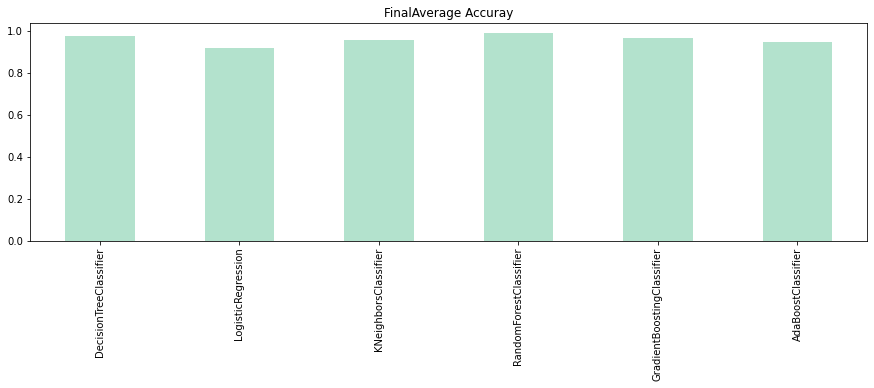

In [877]:
#cross_val['Final Average Accuracy'].plot(kind='bar')
cross_val['Final Average Accuracy'].plot(kind='bar',figsize=(15,4),title='FinalAverage Accuray',colormap='Pastel2')
plt.show()

In [878]:
#AUC_ROC Curve

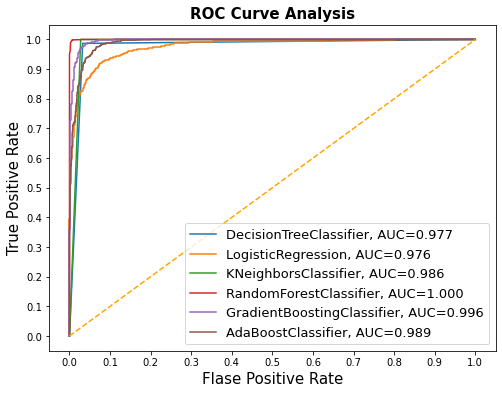

In [879]:
result_table = pd.DataFrame(columns=['Z', 'fpr','tpr','auc'])
for i in range(0,len(Z)):
    model = Z[i]
    model=model.fit( x_train , y_train )
    ypred = model.predict_proba(x_test)[::,1]
    fpr, tpr, _ = roc_curve(y_test,  ypred)
    auc = roc_auc_score(y_test, ypred)
    result_table = result_table.append({'model':model.__class__.__name__,'fpr':fpr,'tpr':tpr,'auc':auc},ignore_index=True)
result_table.set_index('model', inplace=True)

fig = plt.figure(figsize=(8,6))
for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'],result_table.loc[i]['tpr'],label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
plt.plot([0,1], [0,1], color='orange', linestyle='--')
plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)
plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)
plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')
plt.show()

###### Model Comparision

In [880]:
dfcomp=pd.concat([data_frame,cross_val],axis=1)
dfcomp[['Training Accuracy','Testing Accuracy','Final Average Accuracy']].head(6)

,Training Accuracy,Testing Accuracy,Final Average Accuracy
DecisionTreeClassifier,1.000000,0.975960,0.98
LogisticRegression,0.922626,0.922020,0.92
KNeighborsClassifier,0.972391,0.960808,0.96
RandomForestClassifier,1.000000,0.992929,0.99
GradientBoostingClassifier,0.979192,0.972525,0.97
AdaBoostClassifier,0.957037,0.947879,0.95


In [ ]:
dfcomp[['Training Accuracy','Testing Accuracy','Final Average Accuracy']].plot(kind='bar',figsize=(15,6),title='Accuracy Comparision',colormap='summer')

###### Hyperparameter Tuning

In [ ]:
#for Gradient Boosting

In [ ]:
learning_rate=[0.15,0.1,0.05,0.01,0.005,0.001]
n_estimators=[100,250,500,750,1000,1250,1500]
max_depth=[1,3,5,7,9]
min_samples_split=[2,4,6,8,10,20,40,60,100]
min_samples_leaf=[1,3,5,7,9]
max_features=[2,3,4,5,6,7]
subsample=[0.7,0.75,0.8,0.85,0.9,0.95,1]
loss=['deviance','exponential']
criterion=['friedman_mse','mse','mae']

param_distributions = dict(learning_rate=learning_rate,
                           n_estimators=n_estimators,
                           max_depth=max_depth,
                           min_samples_split=min_samples_split,
                           min_samples_leaf=min_samples_leaf,
                           max_features=max_features,
                           subsample=subsample,
                           loss=loss,
                           criterion=criterion)                      

random = RandomizedSearchCV(estimator=GradientBoostingClassifier(),param_distributions=param_distributions,
                            scoring='roc_auc', n_jobs=4, cv=5)
random_result = random.fit(x_train, y_train)
print('Best Score: ', random_result.best_score_)
print('Best Params: ', random_result.best_params_)

###### Final Model

###### Retraining the Model

In [ ]:
#Full Dataset

In [ ]:
y_train=df[['Loan_Status']]
X_train=df.drop(['Loan_Status'],axis=1)

In [ ]:
PScaler=StandardScaler()
PScalerFit=PScaler.fit(X_train)
x_train=PScalerFit.transform(X_train)

print("x_train :",x_train.shape)
print("y_train :",y_train.shape)

In [ ]:
clf =RandomForestClassifier(verbose=100,random_state=500,n_jobs=10,n_estimators=1000,min_weight_fraction_leaf=0.5,min_samples_split=5,min_samples_leaf=3,max_leaf_nodes=12,max_features='auto',max_depth=2,criterion='entropy',class_weight={1: 0.5, 0: 0.5})

finalRF=clf.fit(x_train,y_train)
print("Accuracy :", finalRF.score(x_train, y_train))

paccval=cross_val_score(finalRF, x_train , y_train, cv=5, scoring='f1_weighted')
print('\n\nCross Validation')
print('Accuracy values:',paccval)

print('\nFinal Average Accuracy of the model:', round(paccval.mean(),2))

###### Model Saving

In [ ]:
import pickle
filename='LoanStatus.pk1'
pickle.dump(random,open(filename,'wb'))
print("Model Saved")